# Analysis on NGC 1904

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy import table
import matplotlib

import emcee
import corner

from collections import OrderedDict
import time

from scipy import optimize, stats

In [2]:
font = {'size'   : 16}

matplotlib.rc('font', **font)

In [3]:
#rJ and distance values

# rJ = 175 pc = 0deg46'2'' = 0.767 deg
# d = 13.07


## 2 -  Data

In [4]:
# S5 data
with fits.open('./data/cat_s5_dr3.7.fits') as hdu_list:
    table_S5_full = table.Table(hdu_list[1].data)

In [5]:
# N-body simulation
import h5py

hf = h5py.File('./data/ngc1904_v2705_0.97Gyr.h5','r') 

ra = np.array(hf['ra'])
dec = np.array(hf['dec'])
dist = np.array(hf['dist'])
pmra = np.array(hf['pmra'])
pmdec = np.array(hf['pmdec'])
vhel = np.array(hf['vhel'])


### 2.1 - Stream coordinates

A useful change of coordinates is from equatorial (RA,Dec) to stream ($\phi_1$,$\phi_2$). This is accomplished by what is essentially a 3-d rotation that places $(0,0)$ at the center of the stream, with the stream running as parallel as possible  to the $\phi_1$ axis. This change of coordinates is defined in [Shipp et al. 2019](https://iopscience.iop.org/article/10.3847/1538-4357/ab44bf) and the following function is used.

In [6]:
def phi12_rotmat(alpha,delta,R_phi12_radec):
    '''
    Converts coordinates (alpha,delta) to ones defined by a rotation matrix R_phi12_radec, applied on the original coordinates

    Critical: All angles must be in degrees
    
    Parameters:
    alpha - float. Right ascension
    delta - float. Declination
    R_phi12_radec - 3x3 array. Rotation matrix
    
    Returns:
    [phi1,phi2] - the transformed stream coordinates as a size 2 array.
    '''
    
    vec_radec = np.array([np.cos(alpha*np.pi/180.)*np.cos(delta*np.pi/180.),
                          np.sin(alpha*np.pi/180.)*np.cos(delta*np.pi/180.),
                          np.sin(delta*np.pi/180.)])

    vec_phi12 = np.zeros(np.shape(vec_radec))
    
    vec_phi12[0] = np.sum(R_phi12_radec[0][i]*vec_radec[i] for i in range(3))
    vec_phi12[1] = np.sum(R_phi12_radec[1][i]*vec_radec[i] for i in range(3))
    vec_phi12[2] = np.sum(R_phi12_radec[2][i]*vec_radec[i] for i in range(3))
    
    vec_phi12 = vec_phi12.T

    vec_phi12 = np.dot(R_phi12_radec,vec_radec).T

    phi1 = np.arctan2(vec_phi12[:,1],vec_phi12[:,0])*180./np.pi
    phi1 = phi1
    phi2 = np.arcsin(vec_phi12[:,2])*180./np.pi

    return [phi1,phi2]

Define the rotation matrix

In [7]:
smatrix = np.array([[ 0.14163201, 0.89869552, -0.41507437],
                    [-0.68463391, 0.39177768, 0.61464352 ],
                    [ 0.71499425, 0.19712079, 0.67076569 ]])


Now we convert.

In [8]:
# Convert equatorial to stream
table_S5_full['phi1'], table_S5_full['phi2'] = phi12_rotmat(table_S5_full['ra'],table_S5_full['dec'],smatrix)

<ipython-input-6-277964171489>:22: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  vec_phi12[0] = np.sum(R_phi12_radec[0][i]*vec_radec[i] for i in range(3))
<ipython-input-6-277964171489>:23: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  vec_phi12[1] = np.sum(R_phi12_radec[1][i]*vec_radec[i] for i in range(3))
<ipython-input-6-277964171489>:24: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  vec_phi12[2] = np.sum(R_phi12_radec[2][i]*vec_radec[i] for i in range(3))


Now we choose a range for both $\phi_1$ and $\phi_2$ to consider, outlined below by the black box.

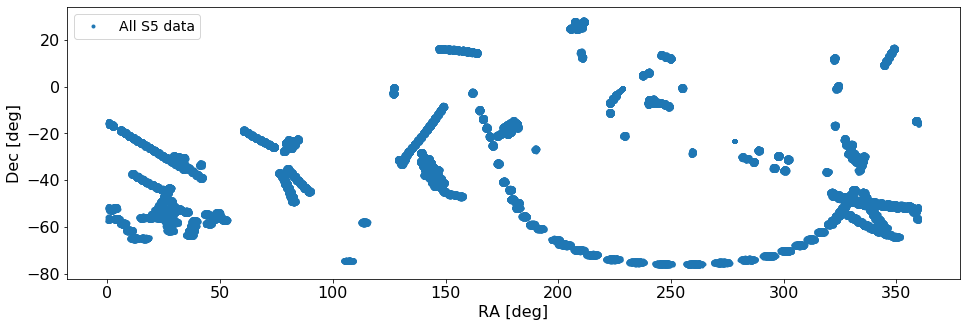

In [9]:
fig, ax = plt.subplots(1,1,figsize=(16,5))

ax.plot(table_S5_full['ra'],table_S5_full['dec'],'.',label='All S5 data')
ax.set(xlabel="RA [deg]", ylabel="Dec [deg]")
ax.legend(ncol=2,loc=2,prop={'size':14})


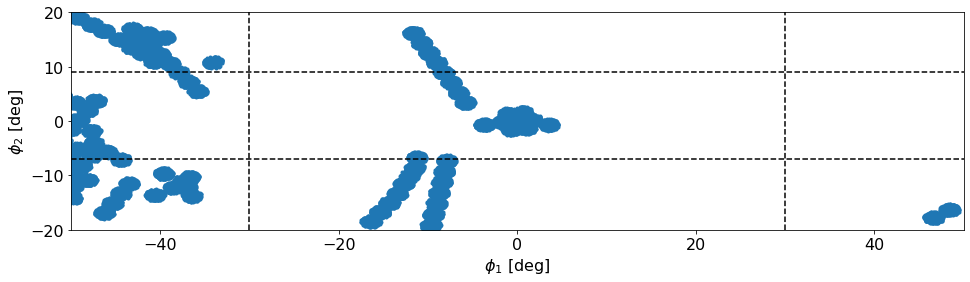

In [10]:
fig, ax = plt.subplots(figsize=(16,4))

ax.plot(table_S5_full['phi1'],table_S5_full['phi2'],'.')

ax.set(xlabel="$\phi_1$ [deg]", ylabel="$\phi_2$ [deg]")
ax.set(xlabel="$\phi_1$ [deg]", ylabel="$\phi_2$ [deg]",xlim=(-50,50),ylim=(-20,20))

plt.axhline(-7,color='k',ls='--')
plt.axhline(9,color='k',ls='--')
plt.axvline(-30,color='k',ls='--')
plt.axvline(30,color='k',ls='--')

In [11]:
print(len(table_S5_full))
stream_data = table_S5_full[((table_S5_full['phi1'] > -5)&(table_S5_full['phi1'] < 5)
              &(table_S5_full['phi2'] > -3)&(table_S5_full['phi2'] < 3))]

print(len(stream_data))

109007
2882


### 2.2 - Convert heliocentric velocity to GSR

We will also convert the velocity measurements, which are heliocentric, to be with respect to the Galactic Standard of Rest (GSR). This will be accomplised using code found [here](https://docs.astropy.org/en/stable/generated/examples/coordinates/rv-to-gsr.html).

In [12]:
def rv_to_gsr(c, v_sun=None):
    """Transform a barycentric radial velocity to the Galactic Standard of Rest
    (GSR).

    The input radial velocity must be passed in as a

    Parameters
    ----------
    c : `~astropy.coordinates.BaseCoordinateFrame` subclass instance
        The radial velocity, associated with a sky coordinates, to be
        transformed.
    v_sun : `~astropy.units.Quantity`, optional
        The 3D velocity of the solar system barycenter in the GSR frame.
        Defaults to the same solar motion as in the
        `~astropy.coordinates.Galactocentric` frame.

    Returns
    -------
    v_gsr : `~astropy.units.Quantity`
        The input radial velocity transformed to a GSR frame.

    """
    if v_sun is None:
        v_sun = coord.Galactocentric().galcen_v_sun.to_cartesian()

    gal = c.transform_to(coord.Galactic)
    cart_data = gal.data.to_cartesian()
    unit_vector = cart_data / cart_data.norm()

    v_proj = v_sun.dot(unit_vector)

    return c.radial_velocity + v_proj

In [13]:
import astropy.coordinates as coord
import astropy.units as u
coord.galactocentric_frame_defaults.set('latest')


#Convert
icrs = coord.SkyCoord(ra=stream_data['ra']*u.deg, dec=stream_data['dec']*u.deg,
                      radial_velocity=stream_data['vel_calib']*u.km/u.s, frame='icrs')
stream_data['vgsr'] = rv_to_gsr(icrs)

Again, we can view the transformation.

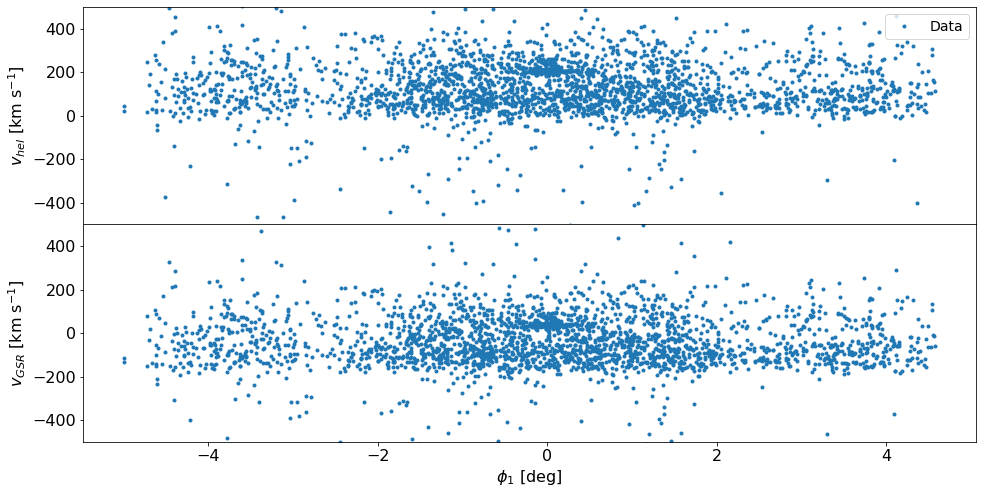

In [14]:
fig, ax = plt.subplots(2,1,figsize=(16,8))

ax[0].plot(stream_data['phi1'], stream_data['vel_calib'],'.',label='Data')
ax[0].set_ylim(-500,500)
ax[0].set_ylabel('$v_{hel}$ [km s$^{-1}$]')
ax[0].legend(ncol=2,loc=1,prop={'size':14})

ax[1].plot(stream_data['phi1'], stream_data['vgsr'],'.')
ax[1].set(xlabel='$\phi_1$ [deg]',ylabel='$v_{GSR}$ [km s$^{-1}$]',ylim=(-500,500))

plt.subplots_adjust(hspace=0)

### 2.3 - Data cuts

Now, we must remove data we do not wish to consider, such as poor quality, large uncertainties, or extreme values in rv, feh, or pm far away from the known members.

In [15]:
# Data cuts

quality_cuts = (stream_data['feh50'] < 0) \
               & (stream_data['vgsr'] < 250) & (stream_data['vgsr'] > -250) \
               & (np.sqrt((stream_data['pmra']-2.469)**2 + (stream_data['pmdec']-(-1.594))**2) < 1.6) \
               & (stream_data['vel_calib_std'] < 20) & (stream_data['feh_calib_std'] < 1) \
               & (stream_data['good_star'] == 1)

stream_data_red = stream_data[quality_cuts]

# stars before and after cut
print(len(stream_data),len(stream_data_red))

2882 1706


We can display the remaining data and make estimates for stream properties (blue lines).

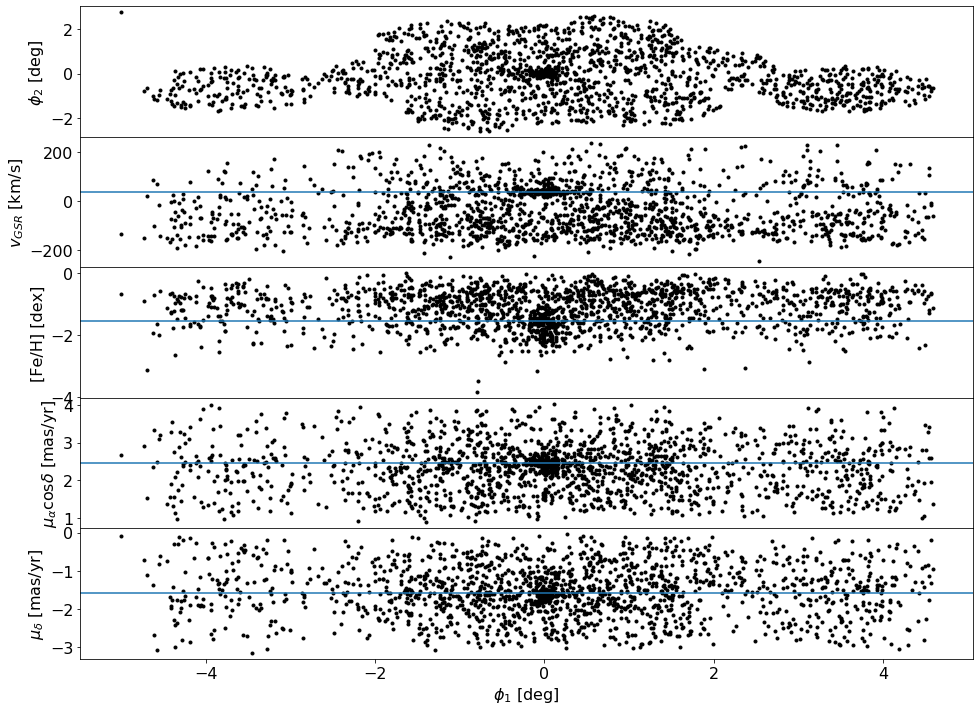

In [16]:
fig, ax = plt.subplots(5,1,figsize=(16,12),sharex=True)

ax[0].plot(stream_data_red['phi1'], stream_data_red['phi2'],'.',color='k',label='Reduced $S^5$ data')
ax[1].plot(stream_data_red['phi1'], stream_data_red['vgsr'],'.',color='k',label='Reduced $S^5$ data')
ax[2].plot(stream_data_red['phi1'], stream_data_red['feh50'],'.',color='k',label='Reduced $S^5$ data')
ax[3].plot(stream_data_red['phi1'], stream_data_red['pmra'],'.',color='k')
ax[4].plot(stream_data_red['phi1'], stream_data_red['pmdec'],'.',color='k')


ax[0].set_ylabel('$\phi_2$ [deg]')
ax[1].set(ylabel=r'$v_{GSR}$ [km/s]')
ax[2].set(ylabel=r'[Fe/H] [dex]')
ax[3].set(ylabel=r'$\mu_{\alpha} \cos\delta$ [mas/yr]')
ax[4].set(xlabel="$\phi_1$ [deg]",ylabel='$\mu_\delta$ [mas/yr]')



# The below mean values are taken from the literature

icrs = coord.SkyCoord(ra=81.0458 *u.deg, dec=-24.5244*u.deg,
                      radial_velocity=205.75*u.km/u.s, frame='icrs')
gc_vgsr = rv_to_gsr(icrs)

ax[1].axhline(gc_vgsr.value)
ax[2].axhline(-1.55)
ax[3].axhline(2.469)
ax[4].axhline(-1.594)
plt.subplots_adjust(hspace=0)

## 3 - Modelling

Now, we must construct a model. As stated before, we will have a stream and background component, each with contributions from `vgsr`, `feh50`, `pmra`, and `pmdec`. `vgsr` and `feh50` will be modelled as 1-d Gaussians, while `pmra` and `pmdec` will be combined with `pmra_pmdec_corr` to be modelled as a 2-d Gaussian. Additionally, the means for the stream component will be a quadratic function of $x=\phi_1/10^\circ$. The weights of the stream and background component will be determined by the parameter `pstream`, the fraction of stars expected to be in the stream. `pstream` is furthermore divided into `pstream_in` and `pstream_out` to have two fractions one inside the Jacobi radius and one outside. These 24 parameters are summarized below.

Parameters:
- pstream_in - fraction of stars in stream within the Jacobi radius
- pstream_out - fraction of stars in stream out the Jacobi radius
- v1, v2, v3 - vgsr track coeffecitents (v1 + v2\*x + v3\*x^2)
- lsigv - log10 vgsr dispersion
- feh1 - metallicity value
- lsigfeh - log10 feh dispersion
- pmra1, pmra2, pmra3 - pmra track coeffecitents
- lsigpmra - log10 pmra dispersion
- pmdec1, pmdec2, pmdec3 - pmdec track coeffecitents
- lsigpmra - log10 pmra dispersion
- bv, lsigbv, bfeh, lsigbfeh, bpmra, lsigbpmra, bpmdec, lsigbpmdec - similar components for the background, no phi1 dependence

In [17]:
param_labels = ["pstream_in", "pstream_out", 
                "v1","v2","v3","lsigv",
                "feh1","lsigfeh",
                "pmra1","pmra2","pmra3","lsigpmra",
                "pmdec1","pmdec2","pmdec3","lsigpmdec",
                "bv", "lsigbv", "bfeh", "lsigbfeh", "bpmra", "lsigbpmra", "bpmdec", "lsigbpmdec"]

We will also define the `quad_f` function for conveience. `logpdf_2dnorm` is the log of the pdf function for a 2d Gaussian. This is necessary as scipy's `multivariate_normal` is extremely slow comparitavely (~12x), not to mention the need to construct a covariance matrix. A function to construct an Ordered Dictionary is also constructed.

In [18]:
def quad_f(phi,c1,c2,c3):
    '''
    Quadratic function
    
    Parameters are all floats, returns a float
    '''
    x = phi/10
    return c1 + c2*x + c3*x**2

def logpdf_2dnorm(x1,x2,m1,m2,s1,s2, meas1, meas2, c):
    v11 = s1**2
    v22 = s2**2
    v12 = c*meas1*meas2
    detcov = (1-c**2)*v11*v22
    d1 = x1 - m1
    d2 = x2 - m2
    
    a = ((2*np.pi)**(-1)) * (detcov**(-1/2))
    b = (-1/2)*(1/detcov)*(d2*(d2*v11-d1*v12)+d1*(d1*v22-d2*v12))
    return np.log(a) + b

def get_paramdict(theta):
    '''Make an ordered dictionary of the parameters as keys and inputted theta as values'''
    return OrderedDict(zip(param_labels, theta))

### 3.1 - The probability function

The MCMC sampler we are using will be `Ensemble_Sampler()` from `emcee`. For this, we must contruct a probability function (`lnprob`), which is the product of the likelihood and the prior. We will also be using the log of these distributions from this point onwards.

The prior will simply be a bunch of hard cutoffs. Essentially, if any one parameter falls outside of the prior, we return a very small value for `lnprob`. At this step, it is very important to (at minimum) set `0 < pstream < 1` otherwise errors will occur in the following code. Set stricter restrictions for `v1`,`feh1`, `pmra1`, and `pmdec1`, otherwise there may be strange results. Expect to change the prior a lot based on parameter results, as sometimes there will be problems like bimodal chains or too restricting.

The likelihood function will be the sums of the logpdfs of vgsr, feh, and pm for each component, then the stream and background components will be scaled by `pstream` and `1-pstream` respectively and added together as well.

Furthermore the distinction is added between stars inside and outside of the Jacobi radius. 

In [19]:
def lnprob(theta, vgsr, vgsr_err, feh, feh_err, pmra, pmra_err, pmdec, pmdec_err, phi1, phi2, pmcorr):
    """ Likelihood and Prior """
    
    # params
    pstream_in, pstream_out,\
    v1, v2, v3, lsigv, \
    feh1, lsigfeh, \
    pmra1, pmra2, pmra3, lsigpmra, \
    pmdec1, pmdec2, pmdec3, lsigpmdec, \
    bv, lsigbv, bfeh, lsigbfeh, bpmra, lsigbpmra, bpmdec, lsigbpmdec = theta
    
    
    # The prior
    if  (pstream_in > 1) or (pstream_in < 0) or (pstream_out > 1) or (pstream_out < 0) or \
        (lsigv > 1) or (lsigfeh > 0) or (lsigpmra > 1) or (lsigpmdec > 1) or \
        (lsigv < -1) or (lsigfeh < -3) or (lsigpmra < -2) or (lsigpmdec < -2) or \
        (lsigbv > 3) or (lsigbfeh > 2) or (lsigbpmra > 2) or (lsigbpmdec > 2) or \
        (lsigbv < -1) or (lsigbfeh < -1) or (lsigbpmra < -1) or (lsigbpmdec < -2) or \
        (feh1 > 0) or (feh1 < -4) or \
        (v1 > 41) or (v1 < 35) or (v2 > 125) or (v2 < -40) or (v3 > 100) or (v3 < -300) or \
        (pmra1 > 3) or (pmra1 < 2) or (pmra2 > 1) or (pmra2 < -1) or (pmra3 > 4) or (pmra3 < -1.5) or \
        (pmdec1 > 0) or (pmdec1 < -3) or (pmdec2 > 2) or (pmdec2 < -1) or (pmdec3 > 2) or (pmdec3 < -5) or \
        (bv > 50) or (bv < -60) or (bfeh > 1) or (bfeh < -5) or (bpmra > 3) or (bpmra < 0) or (bpmdec > 0) or (bpmdec < -4):    

        return -1e10 # outside of prior, return a tiny number
    
    ## Compute log likelihood in v_gsr

    lstream_v = stats.norm.logpdf(vgsr, loc=quad_f(phi1,v1,v2,v3), scale=np.sqrt(vgsr_err**2+(10**lsigv)**2))
    lbg_v = stats.norm.logpdf(vgsr, loc=bv, scale=np.sqrt(vgsr_err**2+(10**lsigbv)**2))
    
    ## Compute log likelihood in feh
    lstream_feh = stats.norm.logpdf(feh, loc=feh1, scale=np.sqrt(feh_err**2+(10**lsigfeh)**2))
    lbg_feh = stats.norm.logpdf(feh, loc=bfeh, scale=np.sqrt(feh_err**2+(10**lsigbfeh)**2))
    
    ## Compute log likelihood in pm
    
    lstream_pm = logpdf_2dnorm(pmra,pmdec,
                               quad_f(phi1,pmra1,pmra2,pmra3),quad_f(phi1,pmdec1,pmdec2,pmdec3),
                               np.sqrt(pmra_err**2+(10**lsigpmra)**2),np.sqrt(pmdec_err**2+(10**lsigpmdec)**2),
                               pmra_err, pmdec_err,
                               pmcorr)
    lbg_pm = logpdf_2dnorm(pmra,pmdec,
                               bpmra,bpmdec,
                               np.sqrt(pmra_err**2+(10**lsigbpmra)**2),np.sqrt(pmdec_err**2+(10**lsigbpmdec)**2),
                               pmra_err, pmdec_err,
                               pmcorr)
  
    ## Combine the components
    D = np.sqrt(phi1**2 + phi2**2)

    lstream = lstream_v + lstream_feh + lstream_pm
    lbg = lbg_v + lbg_feh + lbg_pm
    
    ltot = np.zeros(np.shape(D))
    for i,d in enumerate(D):
        if d < 0.767:
                ltot[i] = np.logaddexp(np.log(pstream_in) + lstream[i], np.log(1-pstream_in) + lbg[i])
        elif d >= 0.767:
                ltot[i] = np.logaddexp(np.log(pstream_out) + lstream[i], np.log(1-pstream_out) + lbg[i])
    
    return np.sum(ltot)

### 3.2 - Visualization

It is very important to check whether the parameter values make sense. For this, we use two functions that help us visualize the distirbutions in `vgsr`, `feh50`, `pmra`, and `pmdec`. The code is rather self explanatory. Note that when displaying the 1-d distributions, it is difficult to display the quadratic track, so the mean is shown to be the constant term (`v1`,`pmra1`,`pmdec1`).

In [20]:
def project_model(theta, vgsr_min, vgsr_max, feh_min, feh_max, pmra_min, pmra_max, pmdec_min, pmdec_max):
    """ Turn parameters into vgsr, pmra, pmdec distributions. An aproximation since no phi dependence"""
    params = get_paramdict(theta)
    
    vgsr_arr = np.linspace(vgsr_min, vgsr_max, 1000)
    feh_arr = np.linspace(feh_min, feh_max, 1000)
    pmra_arr = np.linspace(pmra_min, pmra_max, 1000)
    pmdec_arr = np.linspace(pmdec_min, pmdec_max, 1000)
    
    
    
    pvgsr0 = params['pstream_out']*stats.norm.pdf(vgsr_arr, loc=params['v1'], scale=10**params['lsigv'])
    pvgsr1 = (1-params['pstream_out'])*stats.norm.pdf(vgsr_arr, loc=params['bv'], scale=10**params['lsigbv'])
    
    pfeh0 = params['pstream_out']*stats.norm.pdf(feh_arr, loc=params['feh1'], scale=10**params['lsigfeh'])
    pfeh1 = (1-params['pstream_out'])*stats.norm.pdf(feh_arr, loc=params['bfeh'], scale=10**params['lsigbfeh'])
    
    ppmra0 = params['pstream_out']*stats.norm.pdf(pmra_arr, loc=params['pmra1'], scale=10**params['lsigpmra'])
    ppmra1 = (1-params['pstream_out'])*stats.norm.pdf(pmra_arr, loc=params['bpmra'], scale=10**params['lsigbpmra'])
    
    ppmdec0 = params['pstream_out']*stats.norm.pdf(pmdec_arr, loc=params['pmdec1'], scale=10**params['lsigpmdec'])
    ppmdec1 = (1-params['pstream_out'])*stats.norm.pdf(pmdec_arr, loc=params['bpmdec'], scale=10**params['lsigbpmdec'])
    
    return vgsr_arr, pvgsr0, pvgsr1, feh_arr, pfeh0, pfeh1, pmra_arr, ppmra0, ppmra1, pmdec_arr, ppmdec0, ppmdec1

def plot_1d_distrs(theta):
    '''
    Plots the distributions of vgsr, feh, pmra, pmdec
    '''
    colors = list(plt.rcParams["axes.prop_cycle"].by_key()["color"])
    model_output = project_model(theta,-600,600,-5,2,-2.5,7.5,-5,2.5)
    
    
    fig, axes = plt.subplots(2,2,figsize=(14,14))
    
    #vgsr
    ax = axes[0][0]
    ax.hist(stream_data_red['vgsr'], density=True, color='grey', bins=50)
    xp, p0, p1 = model_output[0:3]
    ax.plot(xp, p0 + p1, 'k-', label='total', lw=3)
    ax.plot(xp, p1, ':', color=colors[1], label='bg', lw=3)
    ax.plot(xp, p0, ':', color=colors[0], label='stream', lw=3)
    ax.set_xlabel('vgsr')
    ax.legend(fontsize='small')

    # [Fe/H]
    ax = axes[0][1]
    ax.hist(stream_data_red['feh50'], density=True, color='grey', bins=50)
    xp, p0, p1 = model_output[3:6]
    ax.plot(xp, p0 + p1, 'k-', lw=3)
    ax.plot(xp, p1, ':', color=colors[1], lw=3)
    ax.plot(xp, p0, ':', color=colors[0], lw=3)
    ax.set_xlabel('feh')
    
    # pmra
    ax = axes[1][0]
    ax.hist(stream_data_red['pmra'], density=True, color='grey', bins=50)
    xp, p0, p1 = model_output[6:9]
    ax.plot(xp, p0 + p1, 'k-', lw=3)
    ax.plot(xp, p1, ':', color=colors[1], lw=3)
    ax.plot(xp, p0, ':', color=colors[0], lw=3)
    ax.set_xlabel('pmra')
    
    # pmdec
    ax = axes[1][1]
    ax.hist(stream_data_red['pmdec'], density=True, color='grey', bins=50)
    xp, p0, p1 = model_output[9:12]
    ax.plot(xp, p0 + p1, 'k-', lw=3)
    ax.plot(xp, p1, ':', color=colors[1], lw=3)
    ax.plot(xp, p0, ':', color=colors[0], lw=3)
    ax.set_xlabel('pmdec')
    return fig

## 4 - Sampling


### 4.1 - Initial guess

Essentially just mess around until it looks about right. The stream component will likely be the one with less members, and will have a much smaller variance in its distribution. Adjust the range in the above functions and increase bins if it is hard to see the stream component. There's no need to be too accurate here, you just need to give a starting position for the next step.

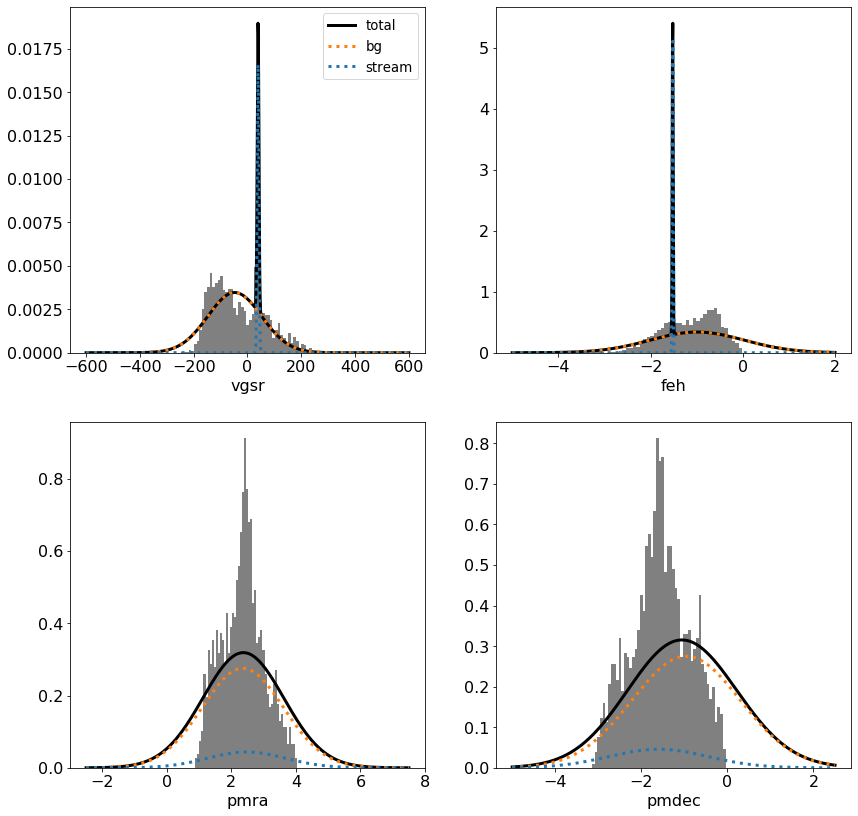

In [21]:
p0_guess = [0.75, 0.132,
            39.33, 11.7, -36.88, 0.5,
            -1.52, -2,
            2.47, 0.19, 0.474, 0.08,
            -1.6, -0.209, -0.6, 0.06,
            -47.57, 2, -0.99, 0.01, 2.355, 0.1, -0.959, 0.1]

fig = plot_1d_distrs(p0_guess)

One can also use scipy's optimize function to find an optimized guess for each parameter. 
Check the parameters to make sure they aren't being restricted by the prior.

### 4.3 - emcee

Now we can set up the MCMC sampling. We will use 100 walkers, and randomize their starting positions by making a 24-d Gaussian distribution in parameter space. In this example, I used 0.002, which might be a bit small but works in this case.

In [22]:
nparams = len(param_labels)

nwalkers = 100
p0 = p0_guess
ep0 = np.zeros(len(p0)) + 0.002
p0s = np.random.multivariate_normal(p0, np.diag(ep0)**2, size=nwalkers)


lkhds = [lnprob(p0s[j],stream_data_red['vgsr'],stream_data_red['vel_calib_std'],
                stream_data_red['feh50'],stream_data_red['feh_calib_std'],
                stream_data_red['pmra'],stream_data_red['pmra_error'],
                stream_data_red['pmdec'],stream_data_red['pmdec_error'],
                stream_data_red['phi1'], stream_data_red['phi2'],
                stream_data_red['pmra_pmdec_corr']) for j in range(nwalkers)]

assert np.all(np.array(lkhds) > -9e9)

Now we run the sampler. It is highly recommended to run the sampler in parallel across multiple cores since this step takes a very long time. Both `multiprocessing` and `schwimmbad` can accomplish this. I will be using 32 cores for this and 3000 steps for each walker.

In [23]:
import multiprocessing
print(multiprocessing.cpu_count())

8


In [24]:
from multiprocessing import Pool
 
## Run emcee in parallel
nproc = 100
nstep = 3000

with Pool(nproc) as pool:
#with MultiPool(nproc) as pool:
    print("Running burnin with {} iterations".format(nstep))
    start = time.time()
    es = emcee.EnsembleSampler(
        nwalkers, len(p0), lnprob,
        args=(stream_data_red['vgsr'],stream_data_red['vel_calib_std'],
              stream_data_red['feh50'],stream_data_red['feh_calib_std'],
              stream_data_red['pmra'],stream_data_red['pmra_error'],
              stream_data_red['pmdec'],stream_data_red['pmdec_error'],
              stream_data_red['phi1'], stream_data_red['phi2'], 
              stream_data_red['pmra_pmdec_corr']),
        pool=pool)
    PP = es.run_mcmc(p0s, nstep)
    print("Took {:.1f} seconds".format(time.time()-start))
    
    print(f"Now running the actual thing")
    es.reset()
    start = time.time()
    es.run_mcmc(PP.coords, nstep)
    print("Took {:.1f} seconds".format(time.time()-start))
    
    chain = es.chain

Running burnin with 3000 iterations
Took 2575.1 seconds
Now running the actual thing
Took 2397.7 seconds


Now we can take a look to see if the chains converge properly. If you are reading the chains from the file, the array is shaped differently.

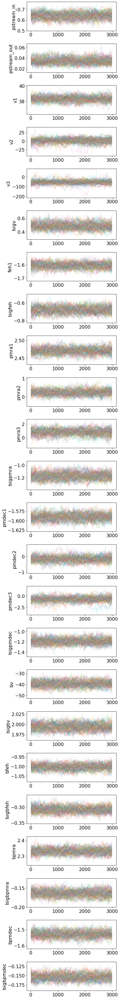

In [25]:
Nrow = chain.shape[2]
fig, axes = plt.subplots(Nrow, figsize=(6,2*Nrow))
for iparam,ax in enumerate(axes):
    for j in range(nwalkers):
        ax.plot(chain[j,:,iparam], lw=.5, alpha=.2)
        ax.set_ylabel(param_labels[iparam])
fig.tight_layout()

We can get the flatchain to view the distribution of points traversed in each parameter space. A corner plot can also be generated this way to see if the results are good.

In [26]:
flatchain = es.flatchain
flatchain.shape

(300000, 24)

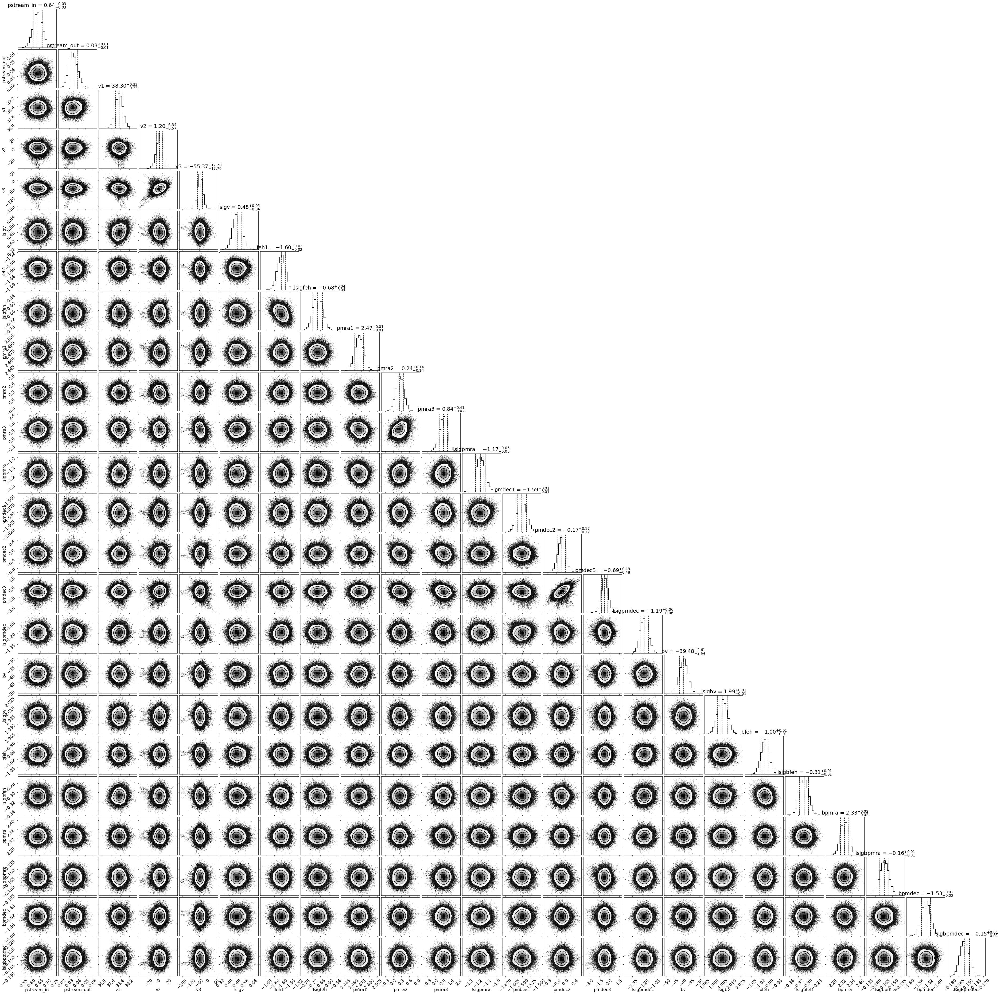

In [27]:
fig = corner.corner(flatchain, labels=param_labels, quantiles=[0.16,0.50,0.84], show_titles=True)
plt.show()

The following function will process the chain and return the optimal paramters and their errors.

In [28]:
def process_chain(chain, avg_error=True):
    ''' Returns the means and errors of teh parameters
    
    Parameters:
    chain - array. The chain
    avg_error - bool. Will average the + and - errors if True
    
    Return:
    2 or 3 OrderedDict as a tuple. means, errors or means, errors+, errors-
    '''
    pctl = np.percentile(chain, [16, 50, 84], axis=0)
    meds = pctl[1]
    ep = pctl[2]-pctl[1]
    em = pctl[0]-pctl[1]
    if avg_error: # just for simplicity, assuming no asymmetry
        err = (ep-em)/2
        return OrderedDict(zip(param_labels, meds)), OrderedDict(zip(param_labels, err))
    else:
        return OrderedDict(zip(param_labels, meds)), OrderedDict(zip(param_labels, ep)), OrderedDict(zip(param_labels, em))

In [29]:
meds, errs = process_chain(flatchain)

In [30]:
bestfits = np.zeros((len(meds.items()), 2))
i = 0
for k,v in meds.items():
    if k[0] == 'l':
        print("{} {:.3f} {:.3f}".format(k[1:], 10**v, np.log(10)*(10**v)*errs[k]))
        bestfits[i,0] = v
        bestfits[i,1] = errs[k]
    else:
        print("{} {:.3f} {:.3f}".format(k, v, errs[k]))
        bestfits[i,0] = v
        bestfits[i,1] = errs[k]
    i += 1


pstream_in 0.640 0.030
pstream_out 0.035 0.006
v1 38.298 0.328
v2 1.198 6.458
v3 -55.375 17.779
sigv 3.045 0.312
feh1 -1.604 0.021
sigfeh 0.209 0.018
pmra1 2.471 0.008
pmra2 0.239 0.144
pmra3 0.843 0.413
sigpmra 0.067 0.008
pmdec1 -1.591 0.008
pmdec2 -0.166 0.166
pmdec3 -0.692 0.487
sigpmdec 0.064 0.008
bv -39.479 2.627
sigbv 98.639 1.847
bfeh -1.003 0.014
sigbfeh 0.492 0.011
bpmra 2.330 0.018
sigbpmra 0.685 0.013
bpmdec -1.529 0.019
sigbpmdec 0.701 0.014


One final check, then if all is good we can save the parameters.

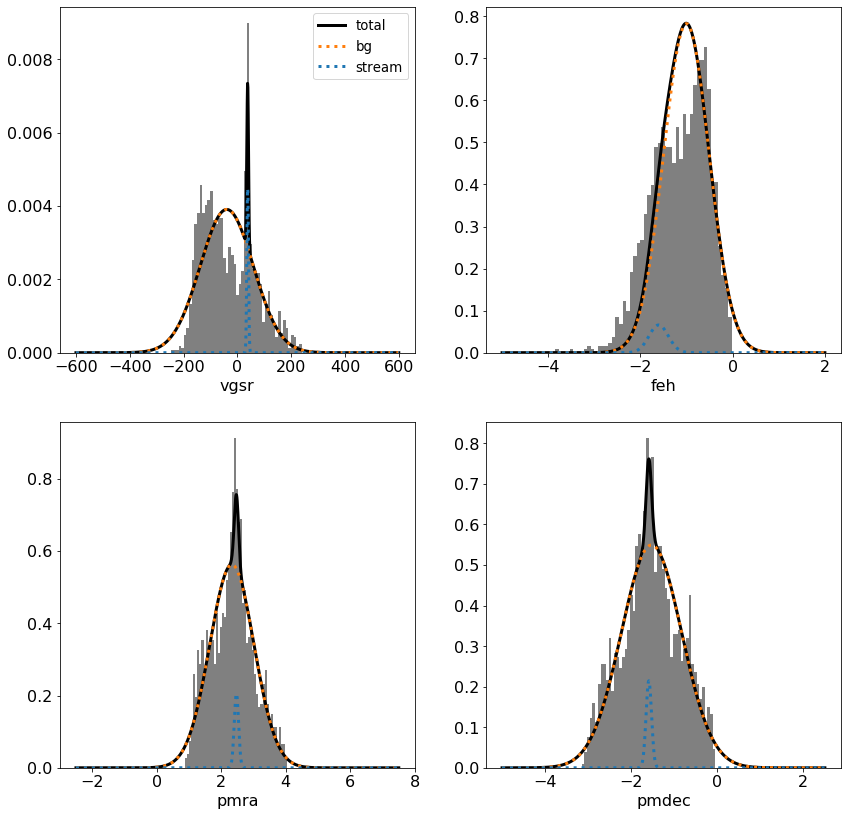

In [31]:
theta_final = []
for _,i in meds.items():
    theta_final.append(i)
fig1 = plot_1d_distrs(theta_final)

## 5 - Membership probability

To calculate membership probability, we need to divide the likelihood of the stream component divided by the likelihood of the stream component and the background component both scaled by `pstream` accordingly.

In [32]:
def memprob(theta, vgsr, vgsr_err, feh, feh_err, pmra, pmra_err, pmdec, pmdec_err, phi1, phi2, pmcorr):
    """ Calculates membership probability based on inputs
    
    Parameters:
    theta - array. model parameters
    vgsr, pmra, pmdec, phi1 - floats. Respective values
    
    Return:
    float. The membership probability
    """
    # params
    pstream_in, pstream_out, \
    v1, v2, v3, lsigv, \
    feh1, lsigfeh, \
    pmra1, pmra2, pmra3, lsigpmra, \
    pmdec1, pmdec2, pmdec3, lsigpmdec, \
    bv, lsigbv, bfeh, lsigbfeh, bpmra, lsigbpmra, bpmdec, lsigbpmdec = theta
    
    ## Compute log likelihood in v_gsr
    lstream_v = stats.norm.logpdf(vgsr, loc=quad_f(phi1,v1,v2,v3), scale=np.sqrt(vgsr_err**2+(10**lsigv)**2))
    lbg_v = stats.norm.logpdf(vgsr, loc=bv, scale=np.sqrt(vgsr_err**2+(10**lsigbv)**2))
    
    ## Compute log likelihood in feh
    lstream_feh = stats.norm.logpdf(feh, loc=feh1, scale=np.sqrt(feh_err**2+(10**lsigfeh)**2))
    lbg_feh = stats.norm.logpdf(feh, loc=bfeh, scale=np.sqrt(feh_err**2+(10**lsigbfeh)**2))
    
    ## Compute log likelihood in pm
    
    lstream_pm = logpdf_2dnorm(pmra,pmdec,
                               quad_f(phi1,pmra1,pmra2,pmra3),quad_f(phi1,pmdec1,pmdec2,pmdec3),
                               np.sqrt(pmra_err**2+(10**lsigpmra)**2),np.sqrt(pmdec_err**2+(10**lsigpmdec)**2),
                               pmra_err, pmdec_err,
                               pmcorr)
    lbg_pm = logpdf_2dnorm(pmra,pmdec,
                               bpmra,bpmdec,
                               np.sqrt(pmra_err**2+(10**lsigbpmra)**2),np.sqrt(pmdec_err**2+(10**lsigbpmdec)**2),
                               pmra_err, pmdec_err,
                               pmcorr)

    ## Combine the components
    D = np.sqrt(phi1**2 + phi2**2)


    lstream = lstream_v + lstream_feh + lstream_pm
    lbg = lbg_v + lbg_feh + lbg_pm
    stream = np.exp(lstream)
    bg = np.exp(lbg)

    for i,d in enumerate(D):
        if d < 0.767:
            p = (pstream_in*stream)/((pstream_in*stream)+(1-pstream_in)*bg)
        elif d >= 0.767:
            p = (pstream_out*stream)/((pstream_out*stream)+(1-pstream_out)*bg)

    return p

In [33]:
stream_prob = memprob(theta_final,stream_data_red['vgsr'],stream_data_red['vel_calib_std'],
                      stream_data_red['feh50'],stream_data_red['feh_calib_std'],
                      stream_data_red['pmra'],stream_data_red['pmra_error'],
                      stream_data_red['pmdec'],stream_data_red['pmdec_error'],
                      stream_data_red['phi1'],stream_data_red['phi2'],
                      stream_data_red['pmra_pmdec_corr'])

Resample from the posterior distributions to check the robustness of each membership probability to changes in the best-fit parameters

In [34]:
import random
N = 100
posterior_samples = np.zeros((len(bestfits), N))

#(numOFvariables x 100)
for i in range(len(bestfits)):
    posterior_samples[i,:] = random.sample(list(flatchain[:,i]), N)

    

stream_prob_samples = np.zeros((len(stream_prob), N))
for i in range(N):
    #print(i+1)
    theta_sample = posterior_samples[:,i] #np.asarray(theta_final)
    stream_prob_samples[:,i] = memprob(theta_sample,stream_data_red['vgsr'],stream_data_red['vel_calib_std'],
                      stream_data_red['feh50'],stream_data_red['feh_calib_std'],
                      stream_data_red['pmra'],stream_data_red['pmra_error'],
                      stream_data_red['pmdec'],stream_data_red['pmdec_error'],
                      stream_data_red['phi1'], stream_data_red['phi2'], 
                      stream_data_red['pmra_pmdec_corr'])

    


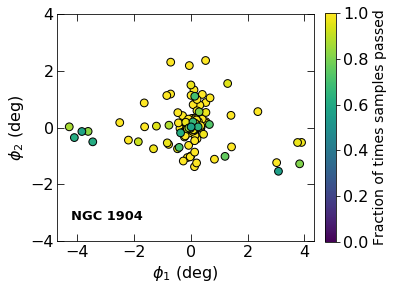

In [35]:
thresh=0.6
from matplotlib.ticker import AutoMinorLocator
Id = np.argsort(stream_prob)


#######################################3

fig, ax = plt.subplots(1,1,figsize=(5,5))

ax.tick_params(which='both', right='on', top='on', direction='in')
ax.tick_params('both', length=5, which='minor')
ax.tick_params('both', length=7, which='major')



ax.set_ylim([-4,4])
ax.set_aspect('equal', adjustable='box')
ax.set_xlabel('$\phi_1$ (deg)')
ax.set_ylabel('$\phi_2$ (deg)')


AA = stream_prob>thresh
F = np.sum(stream_prob_samples>thresh, axis=1) / N
arr = np.argsort(F[AA])[::-1] 


cb2 = ax.scatter(stream_data_red['phi1'][AA][arr], stream_data_red['phi2'][AA][arr], c=F[AA][arr], 
                   vmin=0, vmax=1, cmap='viridis', edgecolor='k', s=60)
plt.colorbar(cb2, ax=ax, fraction=0.041, pad=0.04).set_label(label="Fraction of times samples passed", size=14)


plt.text(-4.2, -3.25, "NGC 1904", fontweight='bold', fontsize=13)


plt.savefig("./Robustness_1904.png", dpi=300, bbox_inches='tight')


plt.show()




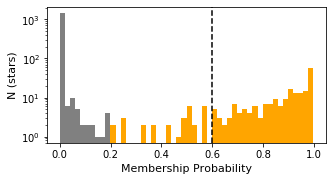

In [36]:
fig, ax = plt.subplots(1,1,figsize=(5,2.5))
n, bins, patches = plt.hist(stream_prob,bins=50, color='orange')

B = np.where(bins<0.2)[0][:-1]
for b in B: 
    patches[b].set_fc('grey')

plt.yscale('log')
plt.xlabel("Membership Probability", fontsize=11)
plt.ylabel("N (stars)", fontsize=11)


ax.tick_params(axis='both', which='major', labelsize=10)
plt.axvline(x=thresh, ls='--', color='k')
plt.savefig("./ProbDistribution_1904.png", dpi=300, bbox_inches='tight')

## 6 - Figures

Below are the main Figures presented in the associated paper

In [37]:
import matplotlib.colors as mcolors
########
grey = (0.5, 0.5, 0.5)  # Grey color

# Create the first part as a solid grey colormap
solid_grey = mcolors.ListedColormap([grey]*20)

# Get the second part from the Wistia colormap
wistia = plt.cm.get_cmap('Wistia_r', 80)

# Combine the two colormaps
colors = np.vstack((solid_grey(np.linspace(0, 1, 20)),
                    wistia(np.linspace(0, 1, 80))))
combined_cmap = mcolors.ListedColormap(colors, name='Grey_Wistia')
##########


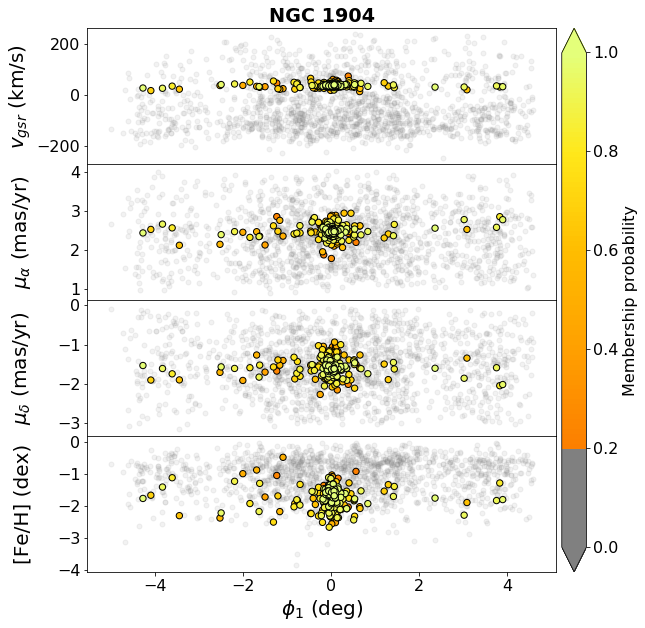

In [38]:
fig, ax = plt.subplots(4,1,figsize=(10,10),sharex=True)

colormap = 'Wistia_r'


ax[0].set_title("NGC 1904", fontweight='bold')

Id = np.argsort(stream_prob)

less = np.where(stream_prob[Id]<0.2) 
more = np.where(stream_prob[Id]>0.2)

######
cm = ax[0].scatter(stream_data_red['phi1'], stream_data_red['phi2'],
                   c=stream_prob,cmap=combined_cmap,edgecolors='k',s=0, alpha=1)
######


ax[0].scatter(stream_data_red['phi1'][Id][less], stream_data_red['vgsr'][Id][less],
              c='grey', alpha=0.1, s=25, label='Potential Members')
ax[0].scatter(stream_data_red['phi1'][Id][more], stream_data_red['vgsr'][Id][more],
              c=stream_prob[Id][more],s=40,edgecolors='k', cmap="Wistia_r")


ax[1].scatter(stream_data_red['phi1'][Id][less], stream_data_red['pmra'][Id][less],
              c='grey', alpha=0.1, s=25, label='Potential Members')
ax[1].scatter(stream_data_red['phi1'][Id][more], stream_data_red['pmra'][Id][more],
              c=stream_prob[Id][more],s=40,edgecolors='k', cmap="Wistia_r")


ax[2].scatter(stream_data_red['phi1'][Id][less], stream_data_red['pmdec'][Id][less],
              c='grey', alpha=0.1, s=25, label='Potential Members')
ax[2].scatter(stream_data_red['phi1'][Id][more], stream_data_red['pmdec'][Id][more],
              c=stream_prob[Id][more],s=40,edgecolors='k', cmap="Wistia_r")

ax[3].scatter(stream_data_red['phi1'][Id][less], stream_data_red['feh50'][Id][less],
              c='grey', alpha=0.1, s=25, label='Potential Members')
ax[3].scatter(stream_data_red['phi1'][Id][more], stream_data_red['feh50'][Id][more],
              c=stream_prob[Id][more],s=40,edgecolors='k', cmap="Wistia_r")



ax[0].set_ylabel(r'$v_{gsr}$ (km/s)', fontsize=20)
ax[1].set_ylabel(r'$\mu_{\alpha}$ (mas/yr)', fontsize=20)
ax[2].set_ylabel('$\mu_\delta$ (mas/yr)', fontsize=20)
ax[3].set_ylabel(r'[Fe/H] (dex)', fontsize=20)
ax[3].set_xlabel('$\phi_1$ (deg)', fontsize=20)
plt.subplots_adjust(hspace=0)

ax[3].set_yticks([-4,-3, -2, -1, 0])
fig.align_ylabels(ax)

cbar = fig.colorbar(cm, ax=ax.ravel().tolist(),label='Membership probability', pad=0.01, extend='both')
cbar.set_ticks([0, 0.2, 0.4, 0.6, 0.8, 1])

plt.savefig("./Probabilities_1904_new.png", dpi=300, bbox_inches='tight')

1706 1706
1705 1705


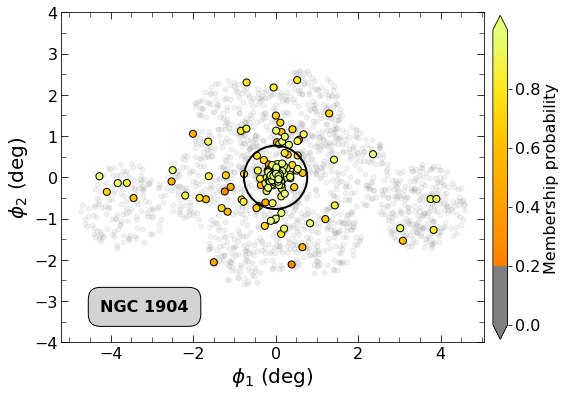

In [39]:
from matplotlib.ticker import AutoMinorLocator

fig, ax = plt.subplots(1,1,figsize=(8,8),sharex=True)

stream_data_red2 = stream_data_red[Id]
stream_prob2 = stream_prob[Id]
aa = np.sqrt((stream_data_red2['phi1'] - (-5))**2+ (stream_data_red2['phi2']-3)**2)>1

print(len(stream_prob2), len(stream_data_red))
stream_data_red2 = stream_data_red2[aa]
stream_prob2 = stream_prob2[aa]
print(len(stream_data_red2), len(stream_prob2))

less = np.where(stream_prob2<0.2) 
ax.scatter(stream_data_red2['phi1'][less], stream_data_red2['phi2'][less],
                   c='grey',s=25, alpha=0.1)
more = np.where(stream_prob2>0.2)
ax.scatter(stream_data_red2['phi1'][more], stream_data_red2['phi2'][more],
                   c=stream_prob2[more],cmap="Wistia_r",edgecolors='k', label='Potential Members',s=50, alpha=1)


cm = ax.scatter(stream_data_red2['phi1'], stream_data_red2['phi2'],
                   c=stream_prob2,cmap=combined_cmap,edgecolors='k', label='Potential Members',s=0, alpha=1)

Drawing_uncolored_circle = plt.Circle( (0, 0), 0.767, fill = False , color='k', alpha=1, lw=2, linestyle='-', label='10*r_J')
ax.add_artist( Drawing_uncolored_circle )


ax.set_aspect('equal', adjustable='box')

ax.set_xlabel('$\phi_1$ (deg)', fontsize=20)
ax.set_ylabel('$\phi_2$ (deg)', fontsize=20)

ax.set_yticks([-4,-3,-2,-1,0,1,2,3,4])

ax.tick_params(which='both', right='on', top='on', direction='in')
ax.tick_params('both', length=5, which='minor')
ax.tick_params('both', length=7, which='major')
minor_locator = AutoMinorLocator(4)
ax.xaxis.set_minor_locator(minor_locator)
minor_locator = AutoMinorLocator(2)
ax.yaxis.set_minor_locator(minor_locator)

plt.text(-4.25, -3.25, "NGC 1904", fontweight='bold', 
       bbox=dict(facecolor='lightgrey', edgecolor='black', boxstyle='round,pad=0.75'))

fig.colorbar(cm,label='Membership probability', fraction=0.033, pad=0.02, extend='both')
plt.savefig("./Probabilities_1904_pos_minorticks.png", dpi=300, bbox_inches='tight')


<ipython-input-6-277964171489>:22: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  vec_phi12[0] = np.sum(R_phi12_radec[0][i]*vec_radec[i] for i in range(3))
<ipython-input-6-277964171489>:23: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  vec_phi12[1] = np.sum(R_phi12_radec[1][i]*vec_radec[i] for i in range(3))
<ipython-input-6-277964171489>:24: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  vec_phi12[2] = np.sum(R_phi12_radec[2][i]*vec_radec[i] for i in range(3))


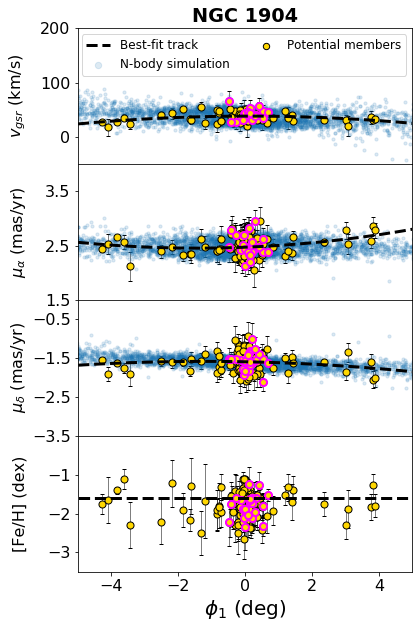

In [40]:
m1 = np.median(stream_data_red['ra'][stream_prob>thresh])
m2 = np.median(stream_data_red['dec'][stream_prob>thresh])

s = 50
a = 0.15
lw=1

mext1 = np.median(ra)
mext2 = np.median(dec)

diff1, diff2 = m1-mext1, m2-mext2


decc = dec+diff1
raa = ra+diff2
Ext_phi1, Ext_phi2 = phi12_rotmat(raa, decc,smatrix)


c1 = 'magenta'
c2 = 'k'

Ext_phi1, Ext_phi2 = phi12_rotmat(raa, decc,smatrix)



fig, ax = plt.subplots(4,1,figsize=(6,10),sharex=True)


icrs = coord.SkyCoord(ra=raa*u.deg, dec=decc*u.deg,
                      radial_velocity=vhel*u.km/u.s, frame='icrs')
Ext_vgsr = rv_to_gsr(icrs)

# Define here the conditions to isolate the top and bottom overdensities
cond0 = (stream_data_red['phi2'][stream_prob>thresh]<-0.5) & (stream_data_red['phi2'][stream_prob>thresh]>-2)  & (stream_data_red['phi1'][stream_prob>thresh]>-0.5)  & (stream_data_red['phi1'][stream_prob>thresh]<0.5)
cond1 = (stream_data_red['phi2'][stream_prob>thresh]>+0.5) & (stream_data_red['phi2'][stream_prob>thresh]<+2) & (stream_data_red['phi1'][stream_prob>thresh]<1) & (stream_data_red['phi1'][stream_prob>thresh]>0)
#cond2 = (stream_data_red['phi1'][stream_prob>thresh]> 0.6) 
#cond3 = (stream_data_red['phi2'][stream_prob>thresh]> 2)
#cond4 = (stream_data_red['phi1'][stream_prob>thresh]< -0.5)

ax[0].set_title("NGC 1904", fontweight='bold')
ax[0].scatter(Ext_phi1, Ext_vgsr, s=10, alpha=a, label="N-body simulation")
ax[0].scatter(stream_data_red['phi1'][stream_prob>thresh], stream_data_red['vgsr'][stream_prob>thresh],
              c='gold',s=s,cmap=colormap,linewidth=lw,edgecolors='k',zorder=1, vmin=0, label='Potential members')
ax[0].scatter(stream_data_red['phi1'][stream_prob>thresh][cond0], stream_data_red['vgsr'][stream_prob>thresh][cond0],
              c='gold',s=s,cmap=colormap,linewidth=lw,edgecolors=c1, lw=2, zorder=1, vmin=0)
ax[0].scatter(stream_data_red['phi1'][stream_prob>thresh][cond1], stream_data_red['vgsr'][stream_prob>thresh][cond1],
              c='gold',s=s,cmap=colormap,linewidth=lw,edgecolors=c1, lw=2, zorder=1, vmin=0)


ax[0].set_ylim([-50,200])




ax[1].scatter(Ext_phi1, pmra, s=10, alpha=a)
ax[1].scatter(stream_data_red['phi1'][stream_prob>thresh], stream_data_red['pmra'][stream_prob>thresh],
              c='gold',s=s,cmap=colormap,linewidth=lw,edgecolors='k',zorder=1, vmin=0)
ax[1].scatter(stream_data_red['phi1'][stream_prob>thresh][cond0], stream_data_red['pmra'][stream_prob>thresh][cond0],
              c='gold',s=s,cmap=colormap,linewidth=lw,edgecolors=c1, lw=2, zorder=1, vmin=0)
ax[1].scatter(stream_data_red['phi1'][stream_prob>thresh][cond1], stream_data_red['pmra'][stream_prob>thresh][cond1],
              c='gold',s=s,cmap=colormap,linewidth=lw,edgecolors=c1, lw=2, zorder=1, vmin=0)



ax[1].set_ylim([1.5,4])


ax[2].scatter(Ext_phi1, pmdec, s=10, alpha=a)
ax[2].scatter(stream_data_red['phi1'][stream_prob>thresh], stream_data_red['pmdec'][stream_prob>thresh],
              s=s,c='gold',cmap=colormap,linewidth=lw,edgecolors='k',zorder=1, vmin=0)
ax[2].scatter(stream_data_red['phi1'][stream_prob>thresh][cond0], stream_data_red['pmdec'][stream_prob>thresh][cond0],
              c='gold',s=s,cmap=colormap,linewidth=lw,edgecolors=c1, lw=2, zorder=1, vmin=0)
ax[2].scatter(stream_data_red['phi1'][stream_prob>thresh][cond1], stream_data_red['pmdec'][stream_prob>thresh][cond1],
              c='gold',s=s,cmap=colormap,linewidth=lw,edgecolors=c1, lw=2, zorder=1, vmin=0)



ax[2].set_xlim([-5,5])
ax[2].set_ylim([-4,0])


ax[3].scatter(stream_data_red['phi1'][stream_prob>thresh], stream_data_red['feh50'][stream_prob>thresh],
              c='gold',s=s,cmap=colormap,linewidth=lw,edgecolors='k',zorder=1, vmin=0)
ax[3].scatter(stream_data_red['phi1'][stream_prob>thresh][cond0], stream_data_red['feh50'][stream_prob>thresh][cond0],
              c='gold',s=s,cmap=colormap,linewidth=lw,edgecolors=c1, lw=2, zorder=1, vmin=0)
ax[3].scatter(stream_data_red['phi1'][stream_prob>thresh][cond1], stream_data_red['feh50'][stream_prob>thresh][cond1],
              c='gold',s=s,cmap=colormap,linewidth=lw,edgecolors=c1, lw=2, zorder=1, vmin=0)




ax[0].errorbar(stream_data_red['phi1'][stream_prob>thresh],
            stream_data_red['vgsr'][stream_prob>thresh],
            yerr=stream_data_red['vel_calib_std'][stream_prob>thresh],
            ms=0,fmt='o',mfc='none',ecolor='k',capsize=2,elinewidth=0.5,zorder=0)

ax[1].errorbar(stream_data_red['phi1'][stream_prob>thresh],
            stream_data_red['pmra'][stream_prob>thresh],
            yerr=stream_data_red['pmra_error'][stream_prob>thresh],
            ms=0,fmt='o',mfc='none',ecolor='k',capsize=2,elinewidth=0.5,zorder=0)

ax[2].errorbar(stream_data_red['phi1'][stream_prob>thresh],
            stream_data_red['pmdec'][stream_prob>thresh],
            yerr=stream_data_red['pmdec_error'][stream_prob>thresh],
            ms=0,fmt='o',mfc='none',ecolor='k',capsize=2,elinewidth=0.5,zorder=0)

ax[3].errorbar(stream_data_red['phi1'][stream_prob>thresh],
            stream_data_red['feh50'][stream_prob>thresh],
            yerr=stream_data_red['feh_calib_std'][stream_prob>thresh],
            ms=0,fmt='o',mfc='none',ecolor='k',capsize=2,elinewidth=0.5,zorder=0)


xr = ax[0].get_xlim()
yr0 = ax[0].get_ylim()
yr1 = ax[3].get_ylim()
yr2 = ax[1].get_ylim()
yr3 = ax[2].get_ylim()


x_arr = np.linspace(-30,30,200)
ax[0].plot(x_arr,quad_f(x_arr,meds['v1'],meds['v2'],meds['v3']),color='k',ls='--', lw=3, label='Best-fit track')
ax[1].plot(x_arr,quad_f(x_arr,meds['pmra1'],meds['pmra2'],meds['pmra3']),color='k',ls='--', lw=3)
ax[2].plot(x_arr,quad_f(x_arr,meds['pmdec1'],meds['pmdec2'],meds['pmdec3']),color='k',ls='--', lw=3)
ax[3].plot(x_arr,meds['feh1']*np.ones(200),color='k',ls='--', lw=3)

ax[0].set_ylim(-0.9,1.6)
ax[0].set(ylabel=r'$v_{gsr}$ (km/s)', ylim=[-50,200])
ax[1].set(ylabel=r'$\mu_{\alpha} $ (mas/yr)')
ax[2].set(xlabel="$\phi_1$ (deg)",ylabel='$\mu_\delta$ (mas/yr)', ylim=[-3.5,0])
ax[3].set(ylabel=r'[Fe/H] (dex)',ylim=[-3.5,0])
ax[3].set_xlabel('$\phi_1$ (deg)', fontsize=20)
plt.subplots_adjust(hspace=0)
lgnd = ax[0].legend(ncol=2, prop={'size': 12})
lgnd.legendHandles[1]._sizes = [40] 
lgnd.legendHandles[2]._sizes = [40]  
lgnd.legendHandles[1]._alpha = 1  
lgnd.legendHandles[2]._alpha = 1  

fig.align_ylabels(ax)


ax[1].set_yticks([1.5, 2.5, 3.5])
ax[2].set_yticks([-3.5, -2.5, -1.5, -0.5])
ax[3].set_yticks([-3, -2, -1])

plt.savefig("./MembersAndSim_1904_new.png", dpi=300, bbox_inches='tight')


Save the best-fit values and the potential members

In [41]:
import pickle as pkl
thresh=0.6
potmem = stream_data_red[stream_prob>thresh]
print(len(stream_data_red), len(potmem))


with open("./Medsfullfit_1904.pkl", "wb") as f:
    pkl.dump((meds, potmem), f)


1706 194


In [42]:
from sklearn.neighbors import KernelDensity

def kde2D(x, y, bandwidth, xbins=100j, ybins=100j, **kwargs): 
    """Build 2D kernel density estimate (KDE)."""

    # create grid of sample locations (default: 100x100)
    xx, yy = np.mgrid[-5:5:100*1j, -4:4:100*1j]

    xy_sample = np.vstack([yy.ravel(), xx.ravel()]).T
    xy_train  = np.vstack([y, x]).T

    kde_skl = KernelDensity(bandwidth=bandwidth, **kwargs)
    kde_skl.fit(xy_train)

    # score_samples() returns the log-likelihood of the samples
    z = np.exp(kde_skl.score_samples(xy_sample))
    return xx, yy, np.reshape(z, xx.shape)

# Main results figure

<ipython-input-6-277964171489>:22: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  vec_phi12[0] = np.sum(R_phi12_radec[0][i]*vec_radec[i] for i in range(3))
<ipython-input-6-277964171489>:23: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  vec_phi12[1] = np.sum(R_phi12_radec[1][i]*vec_radec[i] for i in range(3))
<ipython-input-6-277964171489>:24: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  vec_phi12[2] = np.sum(R_phi12_radec[2][i]*vec_radec[i] for i in range(3))


(-4, 3.5)

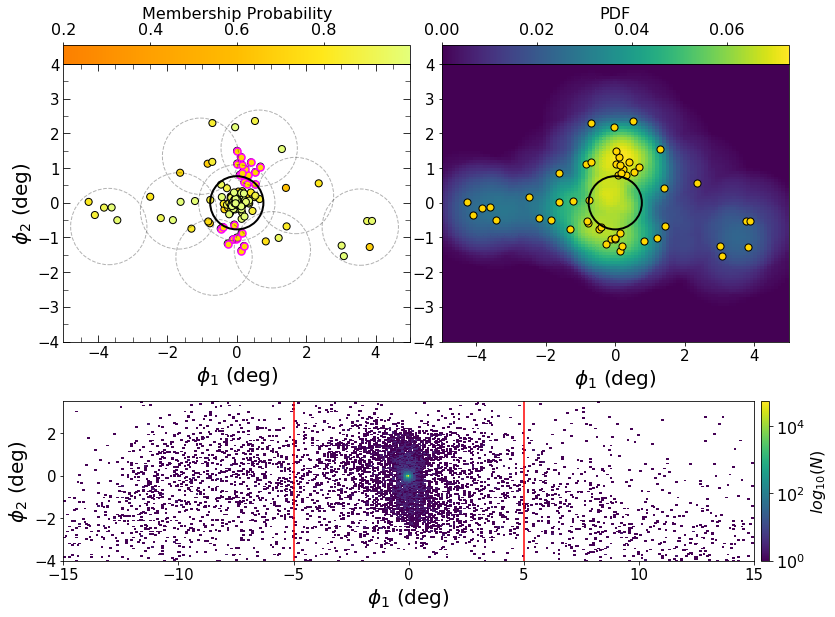

In [43]:
import matplotlib as mpl
from matplotlib.gridspec import GridSpec
fig = plt.figure(figsize=(13,10))
gs = GridSpec(3, 4, figure=fig)
from mpl_toolkits.axes_grid1 import make_axes_locatable

x = np.array([81.045 , 82.886, 82.247, 80.407, 79.206, 79.845, 81.685, 84.4, 78.5])
y = np.array([-24.524, -24.819, -23.222, -22.927, -24.229, -25.826, -26.121, -22.6, -27.5])


#####################################
ax1 = fig.add_subplot(gs[0:2, 0:2])
#####################################

p1, p2 = phi12_rotmat(x,y,smatrix)

for i in range(len(x)):
    Drawing_uncolored_circle = plt.Circle( (p1[i], p2[i]), 1.1, fill = False , color='k', alpha=0.3, linestyle='--')
    ax1.add_artist( Drawing_uncolored_circle )
    


Drawing_uncolored_circle = plt.Circle( (0, 0), 0.767, fill = False , color='k', alpha=1, lw=2, linestyle='-', label='10*r_J')
ax1.add_artist( Drawing_uncolored_circle )


C = ax1.scatter(stream_data_red['phi1'][stream_prob>thresh], stream_data_red['phi2'][stream_prob>thresh],
              c=stream_prob[Id][stream_prob[Id]>thresh], edgecolors='k',cmap='Wistia_r', s=50, vmin=0.2)

cond = (stream_data_red['phi2']<-0.5) & (stream_data_red['phi2']>-2)  & (stream_data_red['phi1']>-0.5)  & (stream_data_red['phi1']<0.5)
#cond2 = (stream_data_red['phi1']> 0.6) 
#cond3 = (stream_data_red['phi2']> 2)
ax1.scatter(stream_data_red['phi1'][cond][stream_prob[cond]>thresh], stream_data_red['phi2'][cond][stream_prob[cond]>thresh],
              facecolors='gold', edgecolors='magenta', lw=1.5, s=50, label=f'Members (p>{thresh})')


cond = (stream_data_red['phi2']>+0.5) & (stream_data_red['phi2']<+2) & (stream_data_red['phi1']<1) & (stream_data_red['phi1']>0)
#cond2 = (stream_data_red['phi1']< -0.5)
ax1.scatter(stream_data_red['phi1'][cond][stream_prob[cond]>thresh], stream_data_red['phi2'][cond][stream_prob[cond]>thresh],
              facecolors='gold', edgecolors='magenta', lw=1.5, s=50, label=f'Members (p>{thresh})')



ax1.set_xlim([-5,5])
ax1.set_ylim([-4,4])

ax1.set_aspect('equal', adjustable='box')

ax1.set_xlabel('$\phi_1$ (deg)', fontsize=20)
ax1.set_ylabel('$\phi_2$ (deg)', fontsize=20)


ax1.tick_params(which='both', right='on', top='on', direction='in')
ax1.tick_params('both', length=5, which='minor')
ax1.tick_params('both', length=7, which='major')
minor_locator = AutoMinorLocator(4)
ax1.xaxis.set_minor_locator(minor_locator)
minor_locator = AutoMinorLocator(2)
ax1.yaxis.set_minor_locator(minor_locator)



divider = make_axes_locatable(ax1)
cax = divider.append_axes("top", size="7%")
cb = plt.colorbar(C, cax=cax,label='Membership Probability', orientation="horizontal")

cb.ax.xaxis.set_ticks_position("top")
cb.ax.xaxis.set_label_position('top')


ax1.tick_params(axis='x', which='major', labelsize=15)
ax1.tick_params(axis='y', which='major', labelsize=15)





#####################################
ax2 = fig.add_subplot(gs[0:2, 2:])
#####################################

x = stream_data_red['phi1'][stream_prob>thresh]
y = stream_data_red['phi2'][stream_prob>thresh]


outside = np.where(np.sqrt(x.value**2 + y.value**2) >= 0.767)
x_out = x[outside]
y_out = y[outside]

ax2.set_aspect('equal', adjustable='box')
ax2.set_xlim([np.min(x_out.value), np.max(x_out.value)])
ax2.set_ylim([np.min(y_out.value), np.max(y_out.value)])


ax2.set_xlim([-5,5])
ax2.set_ylim([-4,4])


 
# Draw the plot
xx, yy, zz = kde2D(x_out, y_out, kernel='epanechnikov', bandwidth=1.5)
cm = plt.pcolormesh(xx, yy, zz, shading='auto', cmap=plt.cm.viridis)

ax2.scatter(x_out, y_out,facecolors='gold', edgecolors='k',label=f'Members (p>{thresh})', s=50)

Drawing_uncolored_circle = plt.Circle( (0, 0), 0.767, fill = False , color='k', alpha=1, lw=2, linestyle='-', label='10*r_J')
ax2.add_artist( Drawing_uncolored_circle )


divider = make_axes_locatable(ax2)
cax = divider.append_axes("top", size="7%")
cb = plt.colorbar(cm, cax=cax,label='PDF', orientation="horizontal")


cb.ax.xaxis.set_ticks_position("top")
cb.ax.xaxis.set_label_position('top')


ax2.tick_params(axis='x', which='major', labelsize=15)
ax2.tick_params(axis='y', which='major', labelsize=15)


ax2.set_xlabel('$\phi_1$ (deg)', fontsize=20)
#ax2.set_ylabel('$\phi_2$ (deg)', fontsize=25)




#####################################
ax3 = fig.add_subplot(gs[2:, :])
#####################################


cond = (Ext_phi1 >-5-10) & (Ext_phi1<5+10) & (Ext_phi2>-4) & (Ext_phi2<4)
x = Ext_phi1[cond]
y = Ext_phi2[cond]

H = ax3.hist2d(x,y-0.25, bins=(400,200), norm=mpl.colors.LogNorm(), cmap=plt.cm.viridis)
ax3.set_xlabel("$\phi_1$ (deg)", fontsize=20)
ax3.set_ylabel("$\phi_2$ (deg)", fontsize=20)

cbar = fig.colorbar(H[3], ax=ax3,label="$log_{10}(N)$", fraction=0.038, pad=0.01)

ax3.tick_params(axis='x', which='major', labelsize=15)
ax3.tick_params(axis='y', which='major', labelsize=15)

ax3.axvline(x=-5, linestyle='-', color='r')
ax3.axvline(x=+5, linestyle='-', color='r')


ax3.set_xlim([-5-10,5+10])
ax3.set_ylim([-4,3.5])



#plt.savefig("./Results_1904_right.png", dpi=300, bbox_inches='tight')


In [44]:
thresh = 0.6
stream_data_final = stream_data_red[stream_prob>thresh]
stream_data_final['mp'] = stream_prob[stream_prob>thresh]

# calculate vgsr minus the vgs from the best-fit track and save that as a new variable
Dv = stream_data_final['vgsr']-quad_f(stream_data_final['phi1'], meds['v1'],meds['v2'],meds['v3'])
stream_data_final['Dv'] = Dv

stream_data_final.write('1904_members_new.fits', format='fits', overwrite=True)

1


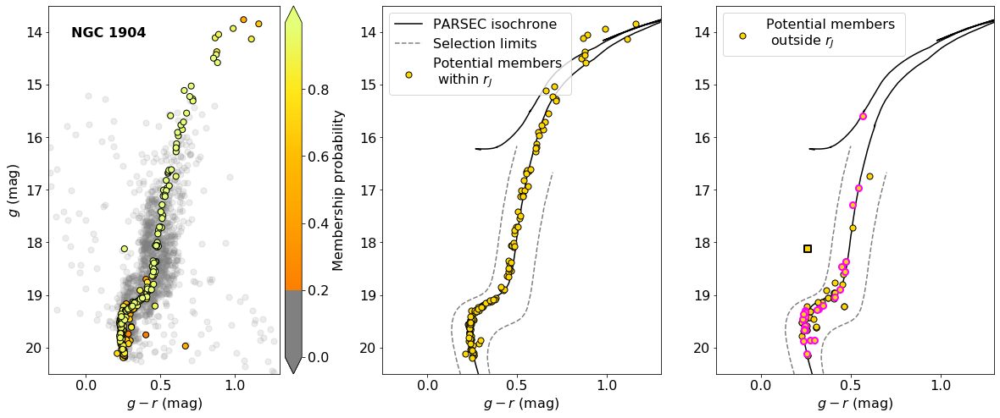

In [45]:
# Perform extinction correction
stream_data_red['gmag0'] = stream_data_red['decam_g'] - stream_data_red['ebv'] * 3.186
stream_data_red['rmag0'] = stream_data_red['decam_r'] - stream_data_red['ebv'] * 2.140



fig, ax = plt.subplots(1,3,figsize=(20,8))


iso = np.loadtxt("./data/isochrone_1904.txt", skiprows=14)
Mag = iso[:,29]
col = iso[:,29] - iso[:,30]
mag = Mag - 5 + 5*np.log10(13.08*1000)


###### 1st subplot ######

######

cm = ax[0].scatter(stream_data_red['phi1'], stream_data_red['phi2'],
                   c=stream_prob,cmap=combined_cmap,edgecolors='k',s=0, alpha=1)
######



less = np.where(stream_prob[Id]<0.2) 
more = np.where(stream_prob[Id]>0.2)


Id = np.argsort(stream_prob)

ax[0].scatter(stream_data_red['gmag0'][Id][less] - stream_data_red['rmag0'][Id][less], stream_data_red['gmag0'][Id][less],
              c='grey', s=50, alpha=0.15)

ax[0].scatter(stream_data_red['gmag0'][Id][more] - stream_data_red['rmag0'][Id][more], stream_data_red['gmag0'][Id][more],
               c=stream_prob[Id][more], cmap='Wistia_r', edgecolor='k', s=50)

ax[0].invert_yaxis()
ax[0].set_xlabel("$g - r$ (mag)")
ax[0].set_ylabel("$g$ (mag)")
plt.colorbar(cm, ax=ax[0], label='Membership probability', extend='both', pad=0.02)#, fraction=0.0453, pad=0.02, extend='both')




r = 0.767

###### 2nd subplot ######
ax[1].plot(col[:120], mag[:120], color='k', label='PARSEC isochrone')
ax[1].plot(col[130:210], mag[130:210], color='k', zorder=0)

ax[1].plot(col[:85]-0.1, mag[:85], zorder=0, color='grey', linestyle='--', label='Selection limits')
ax[1].plot(col[:85]+0.1, mag[:85]+0.5, zorder=0, color='grey', linestyle='--')




cond = (np.sqrt(stream_data_red['phi1']**2 + stream_data_red['phi2']**2) <= r)
cm = ax[1].scatter(stream_data_red['gmag0'][cond][stream_prob[cond]>thresh] - stream_data_red['rmag0'][cond][stream_prob[cond]>thresh], stream_data_red['gmag0'][cond][stream_prob[cond]>thresh],
              facecolors='gold', edgecolors='k', label='Potential members \n within $r_J$',s=50,  zorder=10)
ax[1].set_xlabel("$g - r$ (mag)")
#ax[1].set_ylabel("$g$ (mag)")





###### 3rd subplot ######
#plot isochrone
ax[2].plot(col[:120], mag[:120], color='k', zorder=0)
ax[2].plot(col[130:210], mag[130:210], color='k')
#plot slection limits around isochrone
ax[2].plot(col[:85]-0.1, mag[:85], zorder=0, color='grey', linestyle='--')
ax[2].plot(col[:85]+0.1, mag[:85]+0.5, zorder=0, color='grey', linestyle='--')





cond2 = (stream_data_red['phi1']> 0.6) 
cond3 = (stream_data_red['phi2']> 2)
cond4 = (stream_data_red['phi1']< -0.5)

cond = cond2
ax[2].scatter(stream_data_red['gmag0'][cond][stream_prob[cond]>thresh] - stream_data_red['rmag0'][cond][stream_prob[cond]>thresh], stream_data_red['gmag0'][cond][stream_prob[cond]>thresh],
              facecolors='gold', edgecolors='k', linewidth=1, label='Potential members \n outside $r_J$', s=50, zorder=10)

ax[2].scatter(stream_data_red['gmag0'][cond][stream_prob[cond]>thresh] - stream_data_red['rmag0'][cond][stream_prob[cond]>thresh], stream_data_red['gmag0'][cond][stream_prob[cond]>thresh],
              facecolors='gold', edgecolors=c2, linewidth=1, s=50, zorder=10)
cond = cond3
ax[2].scatter(stream_data_red['gmag0'][cond][stream_prob[cond]>thresh] - stream_data_red['rmag0'][cond][stream_prob[cond]>thresh], stream_data_red['gmag0'][cond][stream_prob[cond]>thresh],
              facecolors='gold', edgecolors=c2, linewidth=1, s=50, zorder=10)
cond = cond4
ax[2].scatter(stream_data_red['gmag0'][cond][stream_prob[cond]>thresh] - stream_data_red['rmag0'][cond][stream_prob[cond]>thresh], stream_data_red['gmag0'][cond][stream_prob[cond]>thresh],
              facecolors='gold', edgecolors=c2, linewidth=1, s=50, zorder=10)



cond0 = (stream_data_red['phi2']<-0.5) & (stream_data_red['phi2']>-2)  & (stream_data_red['phi1']>-0.5)  & (stream_data_red['phi1']<0.5)
cond1 = (stream_data_red['phi2']>+0.5) & (stream_data_red['phi2']<+2) & (stream_data_red['phi1']<1) & (stream_data_red['phi1']>0)
cond = cond0
ax[2].scatter(stream_data_red['gmag0'][cond][stream_prob[cond]>thresh] - stream_data_red['rmag0'][cond][stream_prob[cond]>thresh], stream_data_red['gmag0'][cond][stream_prob[cond]>thresh],
              facecolors='gold', edgecolors=c1, linewidth=2, s=50, zorder=10)
cond = cond1
ax[2].scatter(stream_data_red['gmag0'][cond][stream_prob[cond]>thresh] - stream_data_red['rmag0'][cond][stream_prob[cond]>thresh], stream_data_red['gmag0'][cond][stream_prob[cond]>thresh],
              facecolors='gold', edgecolors=c1, linewidth=2, s=50, zorder=10)


ax[2].set_xlabel("$g - r$ (mag)")


#--------------------------------------------------------
#stars outside limits
out = (np.sqrt(stream_data_red['phi1']**2 + stream_data_red['phi2']**2) > r)

ex = (stream_data_red['gmag0'][out] > 18) & (stream_data_red['gmag0'][out] < 19) & \
       (stream_data_red['gmag0'][out] - stream_data_red['rmag0'][out] < 0.3) & \
       (stream_data_red['gmag0'][out] - stream_data_red['rmag0'][out] > 0.1)
 
print(len(stream_data_red['gmag0'][out][ex][stream_prob[out][ex]>thresh]))
ax[2].scatter(stream_data_red['gmag0'][out][ex][stream_prob[out][ex]>thresh] - stream_data_red['rmag0'][out][ex][stream_prob[out][ex]>thresh], 
              stream_data_red['gmag0'][out][ex][stream_prob[out][ex]>thresh],
              facecolors='gold', edgecolors='k', s=60, linewidth=2, marker='s', zorder=10)



#--------------------------------------------------------




ax[1].legend()
ax[2].legend()


ax[0].set(xlim=[-0.25,1.3],ylim=[20.5, 13.5])
ax[1].set(xlim=[-0.25, 1.3],ylim=[20.5, 13.5])
ax[2].set(xlim=[-0.25,1.3],ylim=[20.5, 13.5])

plt.subplots_adjust(wspace=0.2)

ax[0].text(-0.1, 14.1, "NGC 1904", fontweight='bold')


plt.savefig("./CMDs_1904.png", dpi=300, bbox_inches='tight')






In [46]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.cm as cm
from matplotlib.colors import ListedColormap


def keep_center_colormap(vmin, vmax, center=0):
    vmin = vmin - center
    vmax = vmax - center
    dv = max(-vmin, vmax) * 2
    N = int(256 * dv / (vmax-vmin))
    RdBu_r = cm.get_cmap('Wistia_r', N)
    newcolors = RdBu_r(np.linspace(0, 1, N))
    beg = int((dv / 2 + vmin)*N / dv)
    end = N - int((dv / 2 - vmax)*N / dv)
    newmap = ListedColormap(newcolors[beg:end])
    return newmap



## Repeated plots with bad CMD stars indicated

<ipython-input-6-277964171489>:22: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  vec_phi12[0] = np.sum(R_phi12_radec[0][i]*vec_radec[i] for i in range(3))
<ipython-input-6-277964171489>:23: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  vec_phi12[1] = np.sum(R_phi12_radec[1][i]*vec_radec[i] for i in range(3))
<ipython-input-6-277964171489>:24: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  vec_phi12[2] = np.sum(R_phi12_radec[2][i]*vec_radec[i] for i in range(3))


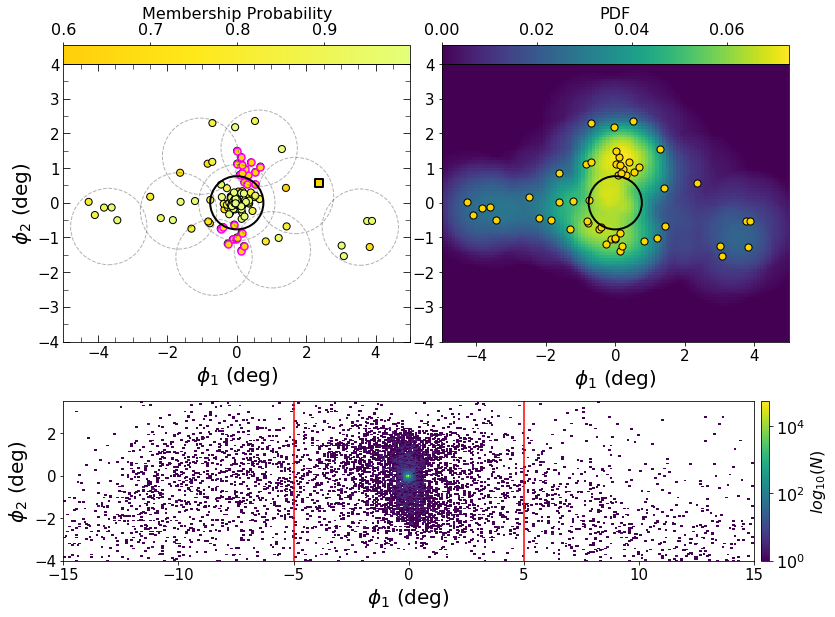

In [47]:
import matplotlib as mpl
from matplotlib.gridspec import GridSpec
fig = plt.figure(figsize=(13,10))
gs = GridSpec(3, 4, figure=fig)

x = np.array([81.045 , 82.886, 82.247, 80.407, 79.206, 79.845, 81.685, 84.4, 78.5])
y = np.array([-24.524, -24.819, -23.222, -22.927, -24.229, -25.826, -26.121, -22.6, -27.5])

newmap = keep_center_colormap(0.6, 1, center=0.5)
#####################################
ax1 = fig.add_subplot(gs[0:2, 0:2])
#####################################

p1, p2 = phi12_rotmat(x,y,smatrix)

for i in range(len(x)):
    Drawing_uncolored_circle = plt.Circle( (p1[i], p2[i]), 1.1, fill = False , color='k', alpha=0.3, linestyle='--')
    ax1.add_artist( Drawing_uncolored_circle )
    


Drawing_uncolored_circle = plt.Circle( (0, 0), 0.767, fill = False , color='k', alpha=1, lw=2, linestyle='-', label='10*r_J')
ax1.add_artist( Drawing_uncolored_circle )


C = ax1.scatter(stream_data_red['phi1'][stream_prob>thresh], stream_data_red['phi2'][stream_prob>thresh],
              c=stream_prob[Id][stream_prob[Id]>thresh], edgecolors='k',cmap=newmap, s=50, vmin=0.6)

cond = (stream_data_red['phi2']<-0.5) & (stream_data_red['phi2']>-2)  & (stream_data_red['phi1']>-0.5)  & (stream_data_red['phi1']<0.5)
#cond2 = (stream_data_red['phi1']> 0.6) 
#cond3 = (stream_data_red['phi2']> 2)
ax1.scatter(stream_data_red['phi1'][cond][stream_prob[cond]>thresh], stream_data_red['phi2'][cond][stream_prob[cond]>thresh],
              facecolors='gold', edgecolors='magenta', lw=1.5, s=50, label=f'Members (p>{thresh})')


cond = (stream_data_red['phi2']>+0.5) & (stream_data_red['phi2']<+2) & (stream_data_red['phi1']<1) & (stream_data_red['phi1']>0)
#cond2 = (stream_data_red['phi1']< -0.5)
ax1.scatter(stream_data_red['phi1'][cond][stream_prob[cond]>thresh], stream_data_red['phi2'][cond][stream_prob[cond]>thresh],
              facecolors='gold', edgecolors='magenta', lw=1.5, s=50, label=f'Members (p>{thresh})')

#------------
#stars outside CMD limits
out = (np.sqrt(stream_data_red['phi1']**2 + stream_data_red['phi2']**2) > r)

ex = (stream_data_red['gmag0'][out] > 18) & (stream_data_red['gmag0'][out] < 19) & \
       (stream_data_red['gmag0'][out] - stream_data_red['rmag0'][out] < 0.3) & \
       (stream_data_red['gmag0'][out] - stream_data_red['rmag0'][out] > 0.1)
 
ax1.scatter(stream_data_red['phi1'][out][ex][stream_prob[out][ex]>thresh], 
              stream_data_red['phi2'][out][ex][stream_prob[out][ex]>thresh],
              facecolors='gold', edgecolors='k', s=60, linewidth=2, marker='s', zorder=10)



#------------


ax1.set_xlim([-5,5])
ax1.set_ylim([-4,4])

ax1.set_aspect('equal', adjustable='box')

ax1.set_xlabel('$\phi_1$ (deg)', fontsize=20)
ax1.set_ylabel('$\phi_2$ (deg)', fontsize=20)


ax1.tick_params(which='both', right='on', top='on', direction='in')
ax1.tick_params('both', length=5, which='minor')
ax1.tick_params('both', length=7, which='major')
minor_locator = AutoMinorLocator(4)
ax1.xaxis.set_minor_locator(minor_locator)
minor_locator = AutoMinorLocator(2)
ax1.yaxis.set_minor_locator(minor_locator)



divider = make_axes_locatable(ax1)
cax = divider.append_axes("top", size="7%")
cb = plt.colorbar(C, cax=cax,label='Membership Probability', orientation="horizontal")


cb.ax.xaxis.set_ticks_position("top")
cb.ax.xaxis.set_label_position('top')


ax1.tick_params(axis='x', which='major', labelsize=15)
ax1.tick_params(axis='y', which='major', labelsize=15)







#####################################
ax2 = fig.add_subplot(gs[0:2, 2:])
#####################################

x = stream_data_red['phi1'][stream_prob>thresh]
y = stream_data_red['phi2'][stream_prob>thresh]


outside = np.where(np.sqrt(x.value**2 + y.value**2) >= 0.767)
x_out = x[outside]
y_out = y[outside]

ax2.set_aspect('equal', adjustable='box')
ax2.set_xlim([np.min(x_out.value), np.max(x_out.value)])
ax2.set_ylim([np.min(y_out.value), np.max(y_out.value)])


ax2.set_xlim([-5,5])
ax2.set_ylim([-4,4])


 
# Make the plot

xx, yy, zz = kde2D(x_out, y_out, kernel='epanechnikov', bandwidth=1.5)
cm = plt.pcolormesh(xx, yy, zz, shading='auto', cmap=plt.cm.viridis)

ax2.scatter(x_out, y_out,facecolors='gold', edgecolors='k',label=f'Members (p>{thresh})', s=50)

Drawing_uncolored_circle = plt.Circle( (0, 0), 0.767, fill = False , color='k', alpha=1, lw=2, linestyle='-', label='10*r_J')
ax2.add_artist( Drawing_uncolored_circle )


divider = make_axes_locatable(ax2)
cax = divider.append_axes("top", size="7%")
cb = plt.colorbar(cm, cax=cax,label='PDF', orientation="horizontal")


cb.ax.xaxis.set_ticks_position("top")
cb.ax.xaxis.set_label_position('top')


ax2.tick_params(axis='x', which='major', labelsize=15)
ax2.tick_params(axis='y', which='major', labelsize=15)


ax2.set_xlabel('$\phi_1$ (deg)', fontsize=20)
#ax2.set_ylabel('$\phi_2$ (deg)', fontsize=25)




#####################################
ax3 = fig.add_subplot(gs[2:, :])
#####################################

cond = (Ext_phi1 >-5-10) & (Ext_phi1<5+10) & (Ext_phi2>-4) & (Ext_phi2<4)
x = Ext_phi1[cond]
y = Ext_phi2[cond]

H = ax3.hist2d(x,y-0.25, bins=(400,200), norm=mpl.colors.LogNorm(), cmap=plt.cm.viridis)
ax3.set_xlabel("$\phi_1$ (deg)", fontsize=20)
ax3.set_ylabel("$\phi_2$ (deg)", fontsize=20)

cbar = fig.colorbar(H[3], ax=ax3,label="$log_{10}(N)$", fraction=0.038, pad=0.01)

ax3.tick_params(axis='x', which='major', labelsize=15)
ax3.tick_params(axis='y', which='major', labelsize=15)

ax3.axvline(x=-5, linestyle='-', color='r')
ax3.axvline(x=+5, linestyle='-', color='r')



ax3.set_xlim([-5-10,5+10])
ax3.set_ylim([-4,3.5])



plt.savefig("./Results_1904_right.png", dpi=300, bbox_inches='tight')


<ipython-input-6-277964171489>:22: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  vec_phi12[0] = np.sum(R_phi12_radec[0][i]*vec_radec[i] for i in range(3))
<ipython-input-6-277964171489>:23: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  vec_phi12[1] = np.sum(R_phi12_radec[1][i]*vec_radec[i] for i in range(3))
<ipython-input-6-277964171489>:24: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  vec_phi12[2] = np.sum(R_phi12_radec[2][i]*vec_radec[i] for i in range(3))


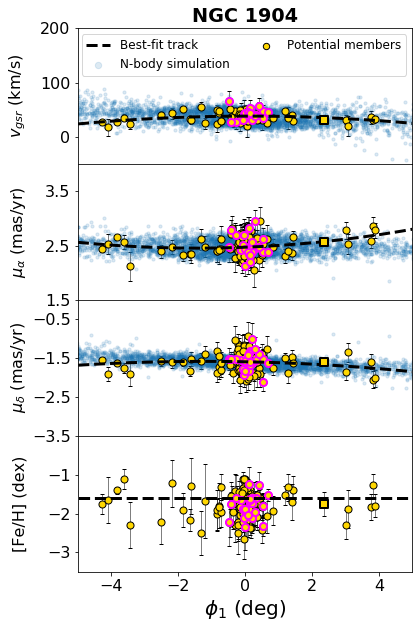

In [48]:
m1 = np.median(stream_data_red['ra'][stream_prob>thresh])
m2 = np.median(stream_data_red['dec'][stream_prob>thresh])

s = 50
a = 0.15
lw=1

mext1 = np.median(ra)
mext2 = np.median(dec)

diff1, diff2 = m1-mext1, m2-mext2


decc = dec+diff1
raa = ra+diff2
Ext_phi1, Ext_phi2 = phi12_rotmat(raa, decc,smatrix)


c1 = 'magenta'
c2 = 'k'

Ext_phi1, Ext_phi2 = phi12_rotmat(raa, decc,smatrix)



fig, ax = plt.subplots(4,1,figsize=(6,10),sharex=True)


icrs = coord.SkyCoord(ra=raa*u.deg, dec=decc*u.deg,
                      radial_velocity=vhel*u.km/u.s, frame='icrs')
Ext_vgsr = rv_to_gsr(icrs)


cond0 = (stream_data_red['phi2'][stream_prob>thresh]<-0.5) & (stream_data_red['phi2'][stream_prob>thresh]>-2)  & (stream_data_red['phi1'][stream_prob>thresh]>-0.5)  & (stream_data_red['phi1'][stream_prob>thresh]<0.5)
cond1 = (stream_data_red['phi2'][stream_prob>thresh]>+0.5) & (stream_data_red['phi2'][stream_prob>thresh]<+2) & (stream_data_red['phi1'][stream_prob>thresh]<1) & (stream_data_red['phi1'][stream_prob>thresh]>0)
#cond2 = (stream_data_red['phi1'][stream_prob>thresh]> 0.6) 
#cond3 = (stream_data_red['phi2'][stream_prob>thresh]> 2)
#cond4 = (stream_data_red['phi1'][stream_prob>thresh]< -0.5)

ax[0].set_title("NGC 1904", fontweight='bold')
ax[0].scatter(Ext_phi1, Ext_vgsr, s=10, alpha=a, label="N-body simulation")
ax[0].scatter(stream_data_red['phi1'][stream_prob>thresh], stream_data_red['vgsr'][stream_prob>thresh],
              c='gold',s=s,cmap=colormap,linewidth=lw,edgecolors='k',zorder=1, vmin=0, label='Potential members')
ax[0].scatter(stream_data_red['phi1'][stream_prob>thresh][cond0], stream_data_red['vgsr'][stream_prob>thresh][cond0],
              c='gold',s=s,cmap=colormap,linewidth=lw,edgecolors=c1, lw=2, zorder=1, vmin=0)
ax[0].scatter(stream_data_red['phi1'][stream_prob>thresh][cond1], stream_data_red['vgsr'][stream_prob>thresh][cond1],
              c='gold',s=s,cmap=colormap,linewidth=lw,edgecolors=c1, lw=2, zorder=1, vmin=0)


ax[0].set_ylim([-50,200])




ax[1].scatter(Ext_phi1, pmra, s=10, alpha=a)
ax[1].scatter(stream_data_red['phi1'][stream_prob>thresh], stream_data_red['pmra'][stream_prob>thresh],
              c='gold',s=s,cmap=colormap,linewidth=lw,edgecolors='k',zorder=1, vmin=0)
ax[1].scatter(stream_data_red['phi1'][stream_prob>thresh][cond0], stream_data_red['pmra'][stream_prob>thresh][cond0],
              c='gold',s=s,cmap=colormap,linewidth=lw,edgecolors=c1, lw=2, zorder=1, vmin=0)
ax[1].scatter(stream_data_red['phi1'][stream_prob>thresh][cond1], stream_data_red['pmra'][stream_prob>thresh][cond1],
              c='gold',s=s,cmap=colormap,linewidth=lw,edgecolors=c1, lw=2, zorder=1, vmin=0)



ax[1].set_ylim([1.5,4])


ax[2].scatter(Ext_phi1, pmdec, s=10, alpha=a)
ax[2].scatter(stream_data_red['phi1'][stream_prob>thresh], stream_data_red['pmdec'][stream_prob>thresh],
              s=s,c='gold',cmap=colormap,linewidth=lw,edgecolors='k',zorder=1, vmin=0)
ax[2].scatter(stream_data_red['phi1'][stream_prob>thresh][cond0], stream_data_red['pmdec'][stream_prob>thresh][cond0],
              c='gold',s=s,cmap=colormap,linewidth=lw,edgecolors=c1, lw=2, zorder=1, vmin=0)
ax[2].scatter(stream_data_red['phi1'][stream_prob>thresh][cond1], stream_data_red['pmdec'][stream_prob>thresh][cond1],
              c='gold',s=s,cmap=colormap,linewidth=lw,edgecolors=c1, lw=2, zorder=1, vmin=0)



ax[2].set_xlim([-5,5])
ax[2].set_ylim([-4,0])


ax[3].scatter(stream_data_red['phi1'][stream_prob>thresh], stream_data_red['feh50'][stream_prob>thresh],
              c='gold',s=s,cmap=colormap,linewidth=lw,edgecolors='k',zorder=1, vmin=0)
ax[3].scatter(stream_data_red['phi1'][stream_prob>thresh][cond0], stream_data_red['feh50'][stream_prob>thresh][cond0],
              c='gold',s=s,cmap=colormap,linewidth=lw,edgecolors=c1, lw=2, zorder=1, vmin=0)
ax[3].scatter(stream_data_red['phi1'][stream_prob>thresh][cond1], stream_data_red['feh50'][stream_prob>thresh][cond1],
              c='gold',s=s,cmap=colormap,linewidth=lw,edgecolors=c1, lw=2, zorder=1, vmin=0)




ax[0].errorbar(stream_data_red['phi1'][stream_prob>thresh],
            stream_data_red['vgsr'][stream_prob>thresh],
            yerr=stream_data_red['vel_calib_std'][stream_prob>thresh],
            ms=0,fmt='o',mfc='none',ecolor='k',capsize=2,elinewidth=0.5,zorder=0)

ax[1].errorbar(stream_data_red['phi1'][stream_prob>thresh],
            stream_data_red['pmra'][stream_prob>thresh],
            yerr=stream_data_red['pmra_error'][stream_prob>thresh],
            ms=0,fmt='o',mfc='none',ecolor='k',capsize=2,elinewidth=0.5,zorder=0)

ax[2].errorbar(stream_data_red['phi1'][stream_prob>thresh],
            stream_data_red['pmdec'][stream_prob>thresh],
            yerr=stream_data_red['pmdec_error'][stream_prob>thresh],
            ms=0,fmt='o',mfc='none',ecolor='k',capsize=2,elinewidth=0.5,zorder=0)

ax[3].errorbar(stream_data_red['phi1'][stream_prob>thresh],
            stream_data_red['feh50'][stream_prob>thresh],
            yerr=stream_data_red['feh_calib_std'][stream_prob>thresh],
            ms=0,fmt='o',mfc='none',ecolor='k',capsize=2,elinewidth=0.5,zorder=0)



#------------
#stars outside CMD limits
out = (np.sqrt(stream_data_red['phi1']**2 + stream_data_red['phi2']**2) > r)

ex = (stream_data_red['gmag0'][out] > 18) & (stream_data_red['gmag0'][out] < 19) & \
       (stream_data_red['gmag0'][out] - stream_data_red['rmag0'][out] < 0.3) & \
       (stream_data_red['gmag0'][out] - stream_data_red['rmag0'][out] > 0.1)

ax[0].scatter(stream_data_red['phi1'][out][ex][stream_prob[out][ex]>thresh], 
              stream_data_red['vgsr'][out][ex][stream_prob[out][ex]>thresh],
              facecolors='gold', edgecolors='k', s=60, linewidth=2, marker='s', zorder=10)
ax[1].scatter(stream_data_red['phi1'][out][ex][stream_prob[out][ex]>thresh], 
              stream_data_red['pmra'][out][ex][stream_prob[out][ex]>thresh],
              facecolors='gold', edgecolors='k', s=60, linewidth=2, marker='s', zorder=10)
ax[2].scatter(stream_data_red['phi1'][out][ex][stream_prob[out][ex]>thresh], 
              stream_data_red['pmdec'][out][ex][stream_prob[out][ex]>thresh],
              facecolors='gold', edgecolors='k', s=60, linewidth=2, marker='s', zorder=10)
ax[3].scatter(stream_data_red['phi1'][out][ex][stream_prob[out][ex]>thresh], 
              stream_data_red['feh50'][out][ex][stream_prob[out][ex]>thresh],
              facecolors='gold', edgecolors='k', s=60, linewidth=2, marker='s', zorder=10)



xr = ax[0].get_xlim()
yr0 = ax[0].get_ylim()
yr1 = ax[3].get_ylim()
yr2 = ax[1].get_ylim()
yr3 = ax[2].get_ylim()


x_arr = np.linspace(-30,30,200)
ax[0].plot(x_arr,quad_f(x_arr,meds['v1'],meds['v2'],meds['v3']),color='k',ls='--', lw=3, label='Best-fit track')
ax[1].plot(x_arr,quad_f(x_arr,meds['pmra1'],meds['pmra2'],meds['pmra3']),color='k',ls='--', lw=3)
ax[2].plot(x_arr,quad_f(x_arr,meds['pmdec1'],meds['pmdec2'],meds['pmdec3']),color='k',ls='--', lw=3)
ax[3].plot(x_arr,meds['feh1']*np.ones(200),color='k',ls='--', lw=3)

ax[0].set_ylim(-0.9,1.6)
ax[0].set(ylabel=r'$v_{gsr}$ (km/s)', ylim=[-50,200])
ax[1].set(ylabel=r'$\mu_{\alpha} $ (mas/yr)')
ax[2].set(xlabel="$\phi_1$ (deg)",ylabel='$\mu_\delta$ (mas/yr)', ylim=[-3.5,0])
ax[3].set(ylabel=r'[Fe/H] (dex)',ylim=[-3.5,0])
ax[3].set_xlabel('$\phi_1$ (deg)', fontsize=20)
plt.subplots_adjust(hspace=0)
lgnd = ax[0].legend(ncol=2, prop={'size': 12})
lgnd.legendHandles[1]._sizes = [40] 
lgnd.legendHandles[2]._sizes = [40]  
lgnd.legendHandles[1]._alpha = 1  
lgnd.legendHandles[2]._alpha = 1  

fig.align_ylabels(ax)


ax[1].set_yticks([1.5, 2.5, 3.5])
ax[2].set_yticks([-3.5, -2.5, -1.5, -0.5])
ax[3].set_yticks([-3, -2, -1])

plt.savefig("./MembersAndSim_1904_new.png", dpi=300, bbox_inches='tight')


1706 1706


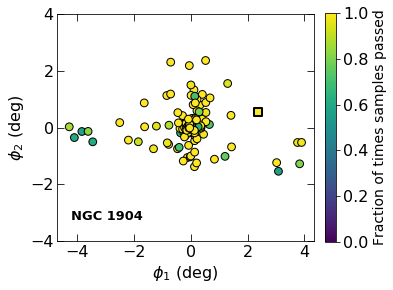

In [49]:
thresh=0.6
from matplotlib.ticker import AutoMinorLocator
Id = np.argsort(stream_prob)


#######################################3

fig, ax = plt.subplots(1,1,figsize=(5,5))

ax.tick_params(which='both', right='on', top='on', direction='in')
ax.tick_params('both', length=5, which='minor')
ax.tick_params('both', length=7, which='major')



ax.set_ylim([-4,4])
ax.set_aspect('equal', adjustable='box')
ax.set_xlabel('$\phi_1$ (deg)')
ax.set_ylabel('$\phi_2$ (deg)')


#AA = stream_prob>thresh
F = np.sum(stream_prob_samples>thresh, axis=1) / N
#arr = np.argsort(F[AA])[::-1] 

out = (np.sqrt(stream_data_red['phi1']**2 + stream_data_red['phi2']**2) > r)

cb2 = ax.scatter(stream_data_red['phi1'][stream_prob>thresh], stream_data_red['phi2'][stream_prob>thresh], c=F[stream_prob>thresh], 
                   vmin=0, vmax=1, cmap='viridis', edgecolor='k', s=60)


##
print(len(F), len(stream_data_red['phi1']))
ex = (stream_data_red['gmag0'][out] > 18) & (stream_data_red['gmag0'][out] < 19) & \
       (stream_data_red['gmag0'][out] - stream_data_red['rmag0'][out] < 0.3) & \
       (stream_data_red['gmag0'][out] - stream_data_red['rmag0'][out] > 0.1)

ax.scatter(stream_data_red['phi1'][out][ex][stream_prob[out][ex]>thresh], 
                 stream_data_red['phi2'][out][ex][stream_prob[out][ex]>thresh], 
                 c=F[out][ex][stream_prob[out][ex]>thresh], 
                   vmin=0, vmax=1, cmap='viridis', edgecolor='k', s=60, linewidth=2, marker='s')



plt.colorbar(cb2, ax=ax, fraction=0.041, pad=0.04).set_label(label="Fraction of times samples passed", size=14)


#plt.subplots_adjust(wspace=0.35)

plt.text(-4.2, -3.25, "NGC 1904", fontweight='bold', fontsize=13)


plt.savefig("./Robustness_1904.png", dpi=300, bbox_inches='tight')


plt.show()




here 37.002207565852984 km / s


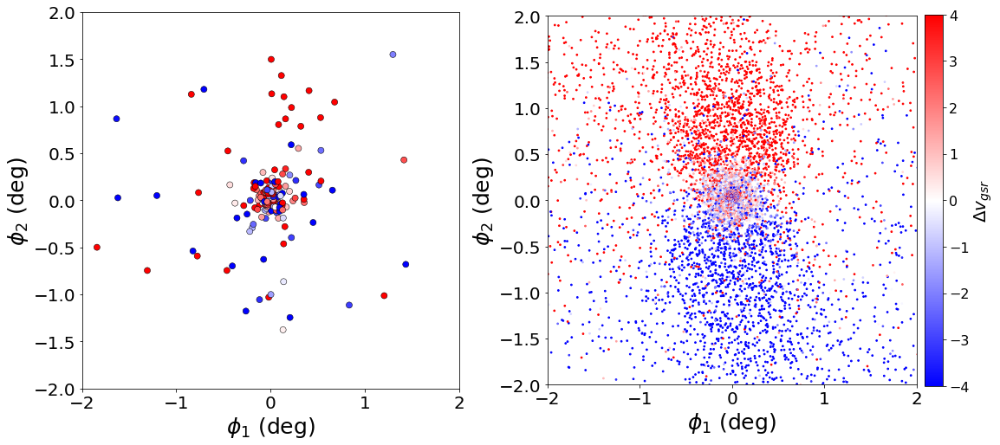

In [50]:
fig, ax = plt.subplots(1,2,figsize=(18,8),sharex=True)

# ---------------------------------------------------------------

icrs_baumgardt = coord.SkyCoord(ra=81.0458*u.deg, dec=-24.5244*u.deg,
                      radial_velocity= 205.6*u.km/u.s, frame='icrs')
vgsr_baumgardt = rv_to_gsr(icrs_baumgardt)
print("here", vgsr_baumgardt)


cm = ax[0].scatter(stream_data_red['phi1'][stream_prob>thresh],
                stream_data_red['phi2'][stream_prob>thresh],
                c=stream_data_red['vgsr'][stream_prob>thresh]-vgsr_baumgardt.value,
              label='Potential Members',s=50,cmap='bwr',linewidth=0.5,edgecolors='k', vmin=-4,vmax=4)



ax[0].set_aspect('equal', adjustable='box')
ax[0].set_xlabel("$\phi_1$ (deg)", fontsize=25)
ax[0].set_ylabel("$\phi_2$ (deg)", fontsize=25)
ax[0].set_xlim([-2,2])
ax[0].set_ylim([-2,2])
ax[0].tick_params(axis='x', labelsize=20)
ax[0].tick_params(axis='y', labelsize=20)

# ---------------------------------------------------------------


cm = ax[1].scatter(Ext_phi1, Ext_phi2-0.2,
                c=Ext_vgsr.value - vgsr_baumgardt.value,
              label='Potential Members',s=3,cmap='bwr', vmin=-4,vmax=4)


ax[1].set_aspect('equal', adjustable='box')
ax[1].set_xlabel("$\phi_1$ (deg)", fontsize=25)
ax[1].set_ylabel("$\phi_2$ (deg)", fontsize=25)

plt.subplots_adjust(hspace=0)

ax[1].set_xlim([-2,2])
ax[1].set_ylim([-2,2])


ax[1].tick_params(axis='x', labelsize=20)
ax[1].tick_params(axis='y', labelsize=20)


cb = fig.colorbar(cm, ax=ax[1],fraction=0.047, pad=0.02)
cb.set_label(label=r'$\Delta v_{gsr}$', size=20)


plt.savefig("./Rotation_1904.png", dpi=300, bbox_inches='tight')



## Distance Gradient 

(1706,) (1706,) (194,) (194,)


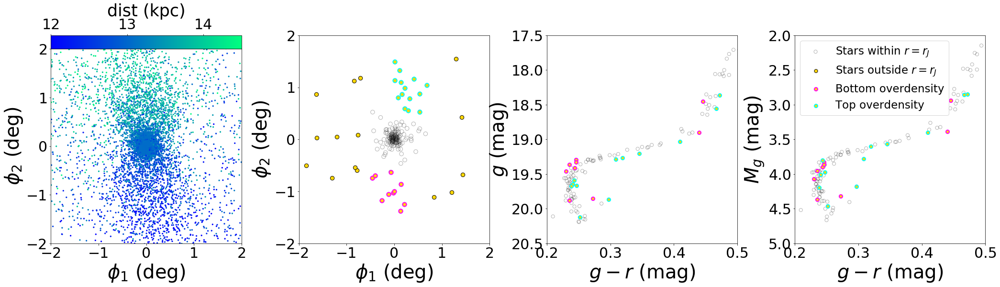

In [51]:
from sklearn.neighbors import NearestNeighbors
from astropy.coordinates import SkyCoord


fig, ax = plt.subplots(1,4,figsize=(35,8))

cm = ax[0].scatter(Ext_phi1, Ext_phi2-0.2, c=dist, label='Potential Members',s=5,cmap='winter', vmin=12, vmax=14.5)


ax[0].set_xlim([-2,2])
ax[0].set_ylim([-2,2])

divider = make_axes_locatable(ax[0])
cax = divider.append_axes("top", size="7%")
cb = plt.colorbar(cm, cax=cax,label='dist (kpc)', orientation="horizontal")
cb.set_label(label='dist (kpc)',size=35)
cb.ax.tick_params(labelsize=30)

cb.ax.xaxis.set_ticks_position("top")
cb.ax.xaxis.set_label_position('top')



stream_data_red['gmag0'] = stream_data_red['decam_g'] - stream_data_red['ebv'] * 3.186
stream_data_red['rmag0'] = stream_data_red['decam_r'] - stream_data_red['ebv'] * 2.140





# ---------------------------------------------------------------





inn = (np.sqrt(stream_data_red['phi1']**2 + stream_data_red['phi2']**2) < r)

ax[1].scatter(stream_data_red['phi1'][inn][stream_prob[inn]>thresh], stream_data_red['phi2'][inn][stream_prob[inn]>thresh],
              facecolors='none', edgecolors='k',label=f'Members (p>{thresh})', alpha=0.3, s=70)

out = (np.sqrt(stream_data_red['phi1']**2 + stream_data_red['phi2']**2) > r)
ax[1].scatter(stream_data_red['phi1'][out][stream_prob[out]>thresh], stream_data_red['phi2'][out][stream_prob[out]>thresh],
              facecolors='gold', edgecolors='k',label=f'Members (p>{thresh})', s=70)



cond = (stream_data_red['phi2']<-0.5) & (stream_data_red['phi2']>-2)  & (stream_data_red['phi1']>-0.5)  & (stream_data_red['phi1']<0.5)
#cond2 = (stream_data_red['phi1']> 0.6) 
#cond3 = (stream_data_red['phi2']> 2)
ax[1].scatter(stream_data_red['phi1'][cond][stream_prob[cond]>thresh], stream_data_red['phi2'][cond][stream_prob[cond]>thresh],
              facecolors='gold', edgecolors=c1, lw=2, label=f'Members (p>{thresh})', s=70)


cond = (stream_data_red['phi2']>+0.5) & (stream_data_red['phi2']<+2) & (stream_data_red['phi1']<1) & (stream_data_red['phi1']>0)
#cond2 = (stream_data_red['phi1']< -0.5)
ax[1].scatter(stream_data_red['phi1'][cond][stream_prob[cond]>thresh], stream_data_red['phi2'][cond][stream_prob[cond]>thresh],
              facecolors='gold', edgecolors='cyan', lw=2, label=f'Members (p>{thresh})', s=70)

ax[1].set_xlim([-2,2])
ax[1].set_ylim([-2,2])

#ax[0].set_aspect('equal', adjustable='box')




# ---------------------------------------------------------------


inn = (np.sqrt(stream_data_red['phi1']**2 + stream_data_red['phi2']**2) < r)
ax[2].scatter(stream_data_red['gmag0'][inn][stream_prob[inn]>thresh] - stream_data_red['rmag0'][inn][stream_prob[inn]>thresh], stream_data_red['gmag0'][inn][stream_prob[inn]>thresh],
              facecolors='none', edgecolors='k', alpha=0.3,s=50,)


cond0 = (stream_data_red['phi2']<-0.5) & (stream_data_red['phi2']>-2)  & (stream_data_red['phi1']>-0.5)  & (stream_data_red['phi1']<0.5)
cond1 = (stream_data_red['phi2']>+0.5) & (stream_data_red['phi2']<+2) & (stream_data_red['phi1']<1) & (stream_data_red['phi1']>0)
out = cond0
ax[2].scatter(stream_data_red['gmag0'][out][stream_prob[out]>thresh] - stream_data_red['rmag0'][out][stream_prob[out]>thresh], stream_data_red['gmag0'][out][stream_prob[out]>thresh],
              facecolors='gold', edgecolors=c1, linewidth=2, s=50)
out = cond1
ax[2].scatter(stream_data_red['gmag0'][out][stream_prob[out]>thresh] - stream_data_red['rmag0'][out][stream_prob[out]>thresh], stream_data_red['gmag0'][out][stream_prob[out]>thresh],
              facecolors='gold', edgecolors='cyan', linewidth=2, s=50)


ax[2].set(xlim=[0.2,0.5],ylim=[20.5, 20.5-3])


# ---------------------------------------------------------------



#### find NN of stars in simulations 
###### subplot 3 ######
#get nearest neighbor of the points in the axis
N = len(stream_data_red)
data = np.zeros((N, 2))
data[:,0] = stream_data_red['ra']
data[:,1] = stream_data_red['dec']

sim = np.zeros((len(ra), 3))
sim[:,0] = raa
sim[:,1] = decc
sim[:,2] = dist


nbrs = NearestNeighbors(n_neighbors=1, algorithm='kd_tree').fit(sim[:,:2])
distances, indices = nbrs.kneighbors(data)

#### get their distances 

obs_dist = sim[indices, 2]
obs_dist = obs_dist.reshape((len(obs_dist),))


#### shift magnitude given new distances m - M = -5 + 5log10(d) --> M = m + 5 - 5log10(d)

m = stream_data_red['gmag0']
M = m + 5 - (5*np.log10(obs_dist*1000))


print(np.shape(obs_dist), np.shape(M), np.shape(stream_data_red['gmag0'][stream_prob>thresh]), np.shape(stream_data_red['rmag0'][stream_prob>thresh]))
#plt.scatter(stream_data_red['gmag0'][stream_prob>thresh] - stream_data_red['rmag0'][stream_prob>thresh], M[stream_prob>thresh]) 


ax[3].scatter(stream_data_red['gmag0'][inn][stream_prob[inn]>thresh] - stream_data_red['rmag0'][inn][stream_prob[inn]>thresh], M[inn][stream_prob[inn]>thresh],
              facecolors='none', edgecolors='k', alpha=0.3,s=50,label='Stars within $r=r_J$')

ax[3].scatter(stream_data_red['gmag0'][inn][stream_prob[inn]>thresh]+100 - stream_data_red['rmag0'][inn][stream_prob[inn]>thresh], M[inn][stream_prob[inn]>thresh]+100,
              facecolors='gold', edgecolors='k', alpha=1,s=50,label='Stars outside $r=r_J$')

out = cond0
ax[3].scatter(stream_data_red['gmag0'][out][stream_prob[out]>thresh] - stream_data_red['rmag0'][out][stream_prob[out]>thresh], M[out][stream_prob[out]>thresh],
              facecolors='gold', edgecolors=c1, linewidth=2, s=50, label='Bottom overdensity')
out = cond1
ax[3].scatter(stream_data_red['gmag0'][out][stream_prob[out]>thresh] - stream_data_red['rmag0'][out][stream_prob[out]>thresh], M[out][stream_prob[out]>thresh],
              facecolors='gold', edgecolors='cyan', linewidth=2, s=50, label='Top overdensity')


s=40
ax[0].set_xlabel("$\phi_1$ (deg)", fontsize=s)
ax[0].set_ylabel("$\phi_2$ (deg)", fontsize=s)

ax[1].set_xlabel('$\phi_1$ (deg)', fontsize=s)
ax[1].set_ylabel('$\phi_2$ (deg)', fontsize=s)

ax[2].set_ylabel("$g$ (mag)", fontsize=s)
ax[2].set_xlabel("$g - r$ (mag)", fontsize=s)

ax[3].set_ylabel("$M_g$ (mag)", fontsize=s)
ax[3].set_xlabel("$g - r$ (mag)", fontsize=s)


s=30
ax[0].tick_params(axis='x', labelsize=s)
ax[0].tick_params(axis='y', labelsize=s)
ax[1].tick_params(axis='x', labelsize=s)
ax[1].tick_params(axis='y', labelsize=s)
ax[2].tick_params(axis='x', labelsize=s)
ax[2].tick_params(axis='y', labelsize=s)
ax[3].tick_params(axis='x', labelsize=s)
ax[3].tick_params(axis='y', labelsize=s)



ax[3].set_xlim([0.2,0.5])
ax[3].set_ylim([5,2])

plt.subplots_adjust(wspace=0.3)
ax[3].legend(loc=2, fontsize=23)

plt.savefig("./DistanceGradient_new.png", dpi=300, bbox_inches='tight')


plt.show()
